In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
#For displyaing all the rows and columns
pd.set_option("display.max_rows", None,"display.max_columns", None)

import warnings
warnings.filterwarnings("ignore")

In [2]:
# importing dataset
Sprocket_Central = pd.ExcelFile("KPMG_VI_New_raw_data_update_final.xlsx")

Transactions = pd.read_excel(Sprocket_Central, "Transactions")
New_Customer_List = pd.read_excel(Sprocket_Central, "NewCustomerList")
Customer_Demographic = pd.read_excel(Sprocket_Central, "CustomerDemographic")
Customer_Address = pd.read_excel(Sprocket_Central, "CustomerAddress")


In [3]:
New_Customer_List = pd.read_excel(Sprocket_Central, "NewCustomerList")

### UNDERSTANDING DATA -

### Data Quality Check of Transaction Dataframe
#### Null Value Handling - 

In [4]:
# Let's look at the Transaction dataframe
Transactions.head()

,Note: The data and information in this document is reflective of a hypothetical situation and client. This document is to be used for KPMG Virtual Internship purposes only.,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
1,1,2,2950,2017-02-25 00:00:00,False,Approved,Solex,Standard,medium,medium,71.49,53.62,2012-12-02 00:00:00
2,2,3,3120,2017-05-21 00:00:00,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,2014-03-03 00:00:00
3,3,37,402,2017-10-16 00:00:00,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,1999-07-20 00:00:00
4,4,88,3135,2017-08-31 00:00:00,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.1,1998-12-16 00:00:00


In [5]:
# set the header - Basically removing the top portion of the sheet 
Transactions_header = Transactions.iloc[0]
Transactions = Transactions.iloc[1:]
Transactions.columns = Transactions_header

In [6]:
# Let's again look at the dataframe
Transactions.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
1,1,2,2950,2017-02-25 00:00:00,False,Approved,Solex,Standard,medium,medium,71.49,53.62,2012-12-02 00:00:00
2,2,3,3120,2017-05-21 00:00:00,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,2014-03-03 00:00:00
3,3,37,402,2017-10-16 00:00:00,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,1999-07-20 00:00:00
4,4,88,3135,2017-08-31 00:00:00,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.1,1998-12-16 00:00:00
5,5,78,787,2017-10-01 00:00:00,True,Approved,Giant Bicycles,Standard,medium,large,1765.3,709.48,2015-08-10 00:00:00


In [7]:
# Let's look at the shape
Transactions.shape

(20000, 13)

In [8]:
# Let's look at the basic information
Transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 1 to 20000
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   transaction_id           20000 non-null  object
 1   product_id               20000 non-null  object
 2   customer_id              20000 non-null  object
 3   transaction_date         20000 non-null  object
 4   online_order             19640 non-null  object
 5   order_status             20000 non-null  object
 6   brand                    19803 non-null  object
 7   product_line             19803 non-null  object
 8   product_class            19803 non-null  object
 9   product_size             19803 non-null  object
 10  list_price               20000 non-null  object
 11  standard_cost            19803 non-null  object
 12  product_first_sold_date  19803 non-null  object
dtypes: object(13)
memory usage: 2.0+ MB


In [9]:
# Changing data type of the variables as required 
Transactions[["transaction_id","product_id","customer_id"]] = Transactions[["transaction_id","product_id", "customer_id"]].apply(pd.to_numeric)
Transactions[["list_price", "standard_cost"]] = Transactions[["list_price", "standard_cost"]].apply(pd.to_numeric, downcast = "float")
Transactions[["transaction_date"]] = Transactions[["transaction_date"]].apply(pd.to_datetime)
Transactions[["product_first_sold_date"]] = Transactions[["product_first_sold_date"]].apply(pd.to_datetime)

In [10]:
# Let's look at the variable 'product_first_sold_date'
Transactions.product_first_sold_date

1       2012-12-02
2       2014-03-03
3       1999-07-20
4       1998-12-16
5       2015-08-10
6       2006-11-10
7       1993-07-15
8       2009-04-12
9       1991-08-05
10      2004-08-17
11      2011-08-29
12      2015-06-17
13      1994-07-12
14      1994-09-09
15      2004-07-25
16      2003-09-09
17      2004-08-07
18      1992-10-11
19      2009-04-12
20      2002-03-22
21      1999-06-23
22      1999-07-20
23      2015-05-21
24      2016-02-04
25      1993-04-20
26      2015-05-21
27      2012-05-18
28      2016-07-09
29      2016-12-06
30      2014-10-10
31      2002-10-10
32      2016-11-14
33      2016-02-04
34      2006-10-01
35      2005-10-22
36      2003-09-10
37      1995-10-24
38      1991-11-07
39      2005-12-07
40      2005-10-22
41      2003-02-16
42      2013-09-16
43      2014-10-10
44      2003-02-16
45      2015-06-17
46      2016-07-09
47      1994-07-12
48      2012-04-10
49      2004-08-07
50      2002-03-22
51      2011-01-10
52      2007-12-11
53      1991

In [11]:
# Let's look at the null values
(Transactions.isnull().sum()/Transactions.shape[0])*100

0
transaction_id             0.000
product_id                 0.000
customer_id                0.000
transaction_date           0.000
online_order               1.800
order_status               0.000
brand                      0.985
product_line               0.985
product_class              0.985
product_size               0.985
list_price                 0.000
standard_cost              0.985
product_first_sold_date    0.985
dtype: float64

Inference - Percentage of null values present in the dataframe is very less. Therefore we will drop the rows with null values

In [12]:
# dropping the rows with null value
Transactions.dropna(inplace= True)

In [13]:
# Let's again look at the percentage of null values in data
(Transactions.isnull().sum()/Transactions.shape[0])*100

0
transaction_id             0.0
product_id                 0.0
customer_id                0.0
transaction_date           0.0
online_order               0.0
order_status               0.0
brand                      0.0
product_line               0.0
product_class              0.0
product_size               0.0
list_price                 0.0
standard_cost              0.0
product_first_sold_date    0.0
dtype: float64

In [14]:
# Shape of the dataframe
Transactions.shape

(19445, 13)

#### Sanity Check

In [15]:
# Value count of "online_order"
Transactions.online_order.value_counts()

True     9739
False    9706
Name: online_order, dtype: int64

In [16]:
# Value count of "order_status"
Transactions.order_status.value_counts()

Approved     19273
Cancelled      172
Name: order_status, dtype: int64

In [17]:
# Value count of "brand"
Transactions.brand.value_counts()

Solex             4169
WeareA2B          3245
Giant Bicycles    3244
OHM Cycles        2993
Trek Bicycles     2931
Norco Bicycles    2863
Name: brand, dtype: int64

In [18]:
# Value count of "product_line"
Transactions.product_line.value_counts()

Standard    13920
Road         3894
Touring      1213
Mountain      418
Name: product_line, dtype: int64

In [19]:
# Value count of "product_class"
Transactions.product_class.value_counts()

medium    13587
high       2952
low        2906
Name: product_class, dtype: int64

In [20]:
# Value count of "product_size"
Transactions.product_size.value_counts()

medium    12767
large      3900
small      2778
Name: product_size, dtype: int64

In [21]:
# checking duplicate transactions
print("Total transactions:",Transactions.shape[0])
print("Total unique transactions:",Transactions.transaction_id.nunique())

Total transactions: 19445
Total unique transactions: 19445


### Data Quality Check of Customer Demographic
#### Null value handling 

In [22]:
# Let's look at the dataframe
Customer_Demographic.head()

,Note: The data and information in this document is reflective of a hypothetical situation and client. This document is to be used for KPMG Virtual Internship purposes only.,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure
1,1,Laraine,Medendorp,F,93,1953-10-12 00:00:00,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11
2,2,Eli,Bockman,Male,81,1980-12-16 00:00:00,Administrative Officer,Financial Services,Mass Customer,N,<script>alert('hi')</script>,Yes,16
3,3,Arlin,Dearle,Male,61,1954-01-20 00:00:00,Recruiting Manager,Property,Mass Customer,N,2018-02-01 00:00:00,Yes,15
4,4,Talbot,NaN,Male,33,1961-10-03 00:00:00,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7


In [23]:
# setting header of the data
Customer_Demographic_header = Customer_Demographic.iloc[0]
Customer_Demographic = Customer_Demographic.iloc[1:]
Customer_Demographic.columns = Customer_Demographic_header

In [24]:
# shape of the dataframe
Customer_Demographic.shape

(4000, 13)

In [25]:
# basic information about the dataframe
Customer_Demographic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 1 to 4000
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   customer_id                          4000 non-null   object
 1   first_name                           4000 non-null   object
 2   last_name                            3875 non-null   object
 3   gender                               4000 non-null   object
 4   past_3_years_bike_related_purchases  4000 non-null   object
 5   DOB                                  3913 non-null   object
 6   job_title                            3494 non-null   object
 7   job_industry_category                3344 non-null   object
 8   wealth_segment                       4000 non-null   object
 9   deceased_indicator                   4000 non-null   object
 10  default                              3698 non-null   object
 11  owns_car                             4000 n

In [26]:
# changing data type of the variables as required
Customer_Demographic[["customer_id", "past_3_years_bike_related_purchases", "tenure"]] = Customer_Demographic[["customer_id", "past_3_years_bike_related_purchases", "tenure"]].apply(pd.to_numeric)
Customer_Demographic[["DOB"]] = Customer_Demographic[["DOB"]].apply(pd.to_datetime)

In [27]:
#dropping the column named "default"
Customer_Demographic.drop("default", axis = 1, inplace= True)

In [28]:
# Let's look at the percentage of null values present in the various columns of the dataframe
Customer_Demographic.isnull().sum()/len(Customer_Demographic)*100

0
customer_id                             0.000
first_name                              0.000
last_name                               3.125
gender                                  0.000
past_3_years_bike_related_purchases     0.000
DOB                                     2.175
job_title                              12.650
job_industry_category                  16.400
wealth_segment                          0.000
deceased_indicator                      0.000
owns_car                                0.000
tenure                                  2.175
dtype: float64

- we are not going to drop the rows with null values in "last_name". Since this variable is not necessarily required.
- column "DOB" and "tenure" have very less percentage of null values (< 5%). Therefore we will drop them.
- Columns "job_title" and "job_industry_category" have sizeble number of null values(12.65% & 16.5% respectively). Since these are categorical columns, therefore our approch will be to define another category to replace these.

In [29]:
#drop rows with null values in "DOB" column
Customer_Demographic = Customer_Demographic[~Customer_Demographic["DOB"].isnull()]

In [30]:
# Defining another category to replace
Customer_Demographic["job_title"] = Customer_Demographic["job_title"].replace(to_replace = np.nan,value = "other_Job_title")
Customer_Demographic["job_industry_category"] = Customer_Demographic["job_industry_category"].replace(to_replace = np.nan,value = "other_job_industry_category")

In [31]:
# let's look at the percentage of null values in the dataframe columns
Customer_Demographic.isnull().sum()/len(Customer_Demographic)*100

0
customer_id                            0.000000
first_name                             0.000000
last_name                              3.092257
gender                                 0.000000
past_3_years_bike_related_purchases    0.000000
DOB                                    0.000000
job_title                              0.000000
job_industry_category                  0.000000
wealth_segment                         0.000000
deceased_indicator                     0.000000
owns_car                               0.000000
tenure                                 0.000000
dtype: float64

#### Sanity Check

In [32]:
# value count of "gender"
Customer_Demographic.gender.value_counts()

Female    2037
Male      1872
U            1
F            1
M            1
Femal        1
Name: gender, dtype: int64

In [33]:
# replace the category as required
Customer_Demographic["gender"] = Customer_Demographic["gender"].replace(to_replace=["M", "F", "Femal"], value = ["Male", "Female", "Female"])

In [34]:
# value count of "job_title"
Customer_Demographic.job_title.value_counts()

other_Job_title                         497
Tax Accountant                           43
Business Systems Development Analyst     43
Social Worker                            42
Recruiting Manager                       41
Internal Auditor                         40
Legal Assistant                          39
Associate Professor                      39
General Manager                          39
Desktop Support Technician               38
Structural Engineer                      38
Sales Representative                     38
Junior Executive                         38
Chemical Engineer                        37
Dental Hygienist                         37
Cost Accountant                          36
Product Engineer                         36
Technical Writer                         36
Senior Financial Analyst                 35
Executive Secretary                      35
Food Chemist                             34
VP Product Management                    34
Registered Nurse                

In [35]:
# value count of "job_industry_category"
Customer_Demographic.job_industry_category.value_counts()

Manufacturing                  796
Financial Services             767
other_job_industry_category    656
Health                         596
Retail                         358
Property                       267
IT                             152
Entertainment                  136
Argiculture                    113
Telecommunications              72
Name: job_industry_category, dtype: int64

In [36]:
# value count of "wealth_segment"
Customer_Demographic.wealth_segment.value_counts()

Mass Customer        1954
High Net Worth        996
Affluent Customer     963
Name: wealth_segment, dtype: int64

In [37]:
# value count of "deceased_indicator" . we would not want to include the dead people in our analysis 
Customer_Demographic.deceased_indicator.value_counts()

N    3911
Y       2
Name: deceased_indicator, dtype: int64

In [38]:
# value count of "owns_car"
Customer_Demographic.owns_car.value_counts()

Yes    1974
No     1939
Name: owns_car, dtype: int64

In [39]:
# extracting year of birth to find out age of the customer
Customer_Demographic["Year"] = pd.DatetimeIndex(Customer_Demographic["DOB"]).year

In [40]:
# defining Age column
Customer_Demographic["Age"] = 2021 - Customer_Demographic["Year"]

#### Outliers Analysis

In [41]:
# statistical summary of data
Customer_Demographic.describe()

,customer_id,past_3_years_bike_related_purchases,tenure,Year,Age
count,3913.000000,3913.000000,3913.000000,3913.000000,3913.000000
mean,1999.325837,49.041912,10.657041,1977.030667,43.969333
std,1155.183301,28.764990,5.660146,12.796387,12.796387
min,1.000000,0.000000,1.000000,1843.000000,19.000000
25%,1002.000000,24.000000,6.000000,1968.000000,34.000000
50%,1999.000000,48.000000,11.000000,1977.000000,44.000000
75%,2997.000000,73.000000,15.000000,1987.000000,53.000000
max,4000.000000,99.000000,22.000000,2002.000000,178.000000


Inference -- In Age column we can observe that max age is 178. Practically it is not possible

In [42]:
# extracting customers with more then 100 year old.
Customer_Demographic[Customer_Demographic.Age >= 100]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Year,Age
34,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,1843,178


In [43]:
# dropping the data as required
Customer_Demographic.drop(34, inplace= True)

In [44]:
print("Total customer_id: ", Customer_Demographic.shape[0])
print("Total unique customer_id:", Customer_Demographic["customer_id"].nunique())

Total customer_id:  3912
Total unique customer_id: 3912


### Data Quality Check of New Customer List

In [45]:
#let's look at the dataset
New_Customer_List.head()

,Note: The data and information in this document is reflective of a hypothetical situation and client. This document is to be used for KPMG Virtual Internship purposes only.,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,NaN,NaN,NaN,NaN,NaN,Rank,Value
1,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,14,45 Shopko Center,4500,QLD,Australia,6,1.03,1.2875,1.609375,1.367969,1.0,1,1.71875
2,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,16,14 Mccormick Park,2113,NSW,Australia,11,0.88,0.8800,1.100000,0.935000,1.0,1,1.71875
3,Ardelis,Forrester,Female,10,1974-08-28 00:00:00,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,10,5 Colorado Crossing,3505,VIC,Australia,5,0.71,0.7100,0.710000,0.710000,1.0,1,1.71875
4,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,5,207 Annamark Plaza,4814,QLD,Australia,1,0.63,0.7875,0.787500,0.787500,4.0,4,1.70312


In [46]:
# setting header of the dataframe
New_Customer_List_header = New_Customer_List.iloc[0]
New_Customer_List = New_Customer_List.iloc[1:]
New_Customer_List.columns = New_Customer_List_header

In [47]:
# look at the head of the dataframe
New_Customer_List.head()

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,NaN,NaN,NaN,NaN,NaN,Rank,Value
1,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,14,45 Shopko Center,4500,QLD,Australia,6,1.03,1.2875,1.609375,1.367969,1.0,1,1.71875
2,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,16,14 Mccormick Park,2113,NSW,Australia,11,0.88,0.8800,1.100000,0.935000,1.0,1,1.71875
3,Ardelis,Forrester,Female,10,1974-08-28 00:00:00,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,10,5 Colorado Crossing,3505,VIC,Australia,5,0.71,0.7100,0.710000,0.710000,1.0,1,1.71875
4,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,5,207 Annamark Plaza,4814,QLD,Australia,1,0.63,0.7875,0.787500,0.787500,4.0,4,1.70312
5,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,19,115 Montana Place,2093,NSW,Australia,9,0.51,0.5100,0.637500,0.637500,4.0,4,1.70312


In [48]:
# shape of the dataframe
New_Customer_List.shape

(1000, 23)

In [49]:
#We can observe so many nan colums so it is best we drop those columns 

In [50]:
# drop the column named as NaN
New_Customer_List = New_Customer_List.iloc[:,[i for i in range(16)]+[21,22]]

In [51]:
# basic information about the dataframe
New_Customer_List.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 1 to 1000
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   first_name                           1000 non-null   object
 1   last_name                            971 non-null    object
 2   gender                               1000 non-null   object
 3   past_3_years_bike_related_purchases  1000 non-null   object
 4   DOB                                  983 non-null    object
 5   job_title                            894 non-null    object
 6   job_industry_category                835 non-null    object
 7   wealth_segment                       1000 non-null   object
 8   deceased_indicator                   1000 non-null   object
 9   owns_car                             1000 non-null   object
 10  tenure                               1000 non-null   object
 11  address                              1000 n

In [52]:
# changing the data type of the variables as required
New_Customer_List[["past_3_years_bike_related_purchases", "tenure", "postcode","property_valuation", "Rank"]] = New_Customer_List[["past_3_years_bike_related_purchases", "tenure", "postcode","property_valuation", "Rank"]].apply(pd.to_numeric)
New_Customer_List[["Value"]] = pd.to_numeric(New_Customer_List.Value, downcast= "float")
New_Customer_List[["DOB"]] = pd.to_datetime(New_Customer_List.DOB)

In [53]:
# Let's look at the percentage of null values present in the dataframe columns
New_Customer_List.isnull().sum()/len(New_Customer_List)*100

0
first_name                              0.0
last_name                               2.9
gender                                  0.0
past_3_years_bike_related_purchases     0.0
DOB                                     1.7
job_title                              10.6
job_industry_category                  16.5
wealth_segment                          0.0
deceased_indicator                      0.0
owns_car                                0.0
tenure                                  0.0
address                                 0.0
postcode                                0.0
state                                   0.0
country                                 0.0
property_valuation                      0.0
Rank                                    0.0
Value                                   0.0
dtype: float64

- we are not going to drop the rows with null values in "last_name". Since this variable is not necessarily required.
- column "DOB" has very less percentage of null values. Therefore we will drop them.
- Columns "job_title" and "job_industry_category" have null values and are in decent number. since, these are categorical column therefore we can define another category to replace these.

In [54]:
#dropping the rows with null values in the "DOB" column
New_Customer_List = New_Customer_List[~New_Customer_List["DOB"].isnull()]

In [55]:
# Defining another category to replace
New_Customer_List["job_title"] = New_Customer_List["job_title"].replace(to_replace = np.nan,value = "other_Job_title")
New_Customer_List["job_industry_category"] = New_Customer_List["job_industry_category"].replace(to_replace = np.nan,value = "other_job_industry_category")

In [56]:
# extracting year of birth to find out age of the customer
New_Customer_List["Year"] = pd.DatetimeIndex(New_Customer_List["DOB"]).year

In [57]:
# defining column Age
New_Customer_List["Age"] = 2021 - New_Customer_List["Year"]

#### Sanity Check

In [58]:
# value count of "gender"
New_Customer_List.gender.value_counts()

Female    513
Male      470
Name: gender, dtype: int64

In [59]:
# value count of "job_title"
New_Customer_List.job_title.value_counts()

other_Job_title                         105
Associate Professor                      14
Software Consultant                      14
Environmental Tech                       14
Chief Design Engineer                    13
Cost Accountant                          12
Assistant Manager                        12
VP Sales                                 12
Senior Sales Associate                   12
Social Worker                            11
Environmental Specialist                 11
Assistant Media Planner                  11
VP Marketing                             11
Junior Executive                         11
Account Executive                        11
Payment Adjustment Coordinator           11
Nurse Practicioner                       11
VP Quality Control                       11
Product Engineer                         10
Business Systems Development Analyst     10
Structural Engineer                      10
Librarian                                10
Chemical Engineer               

In [60]:
# value count of "job_industry_category"
New_Customer_List.job_industry_category.value_counts()

Financial Services             202
Manufacturing                  199
other_job_industry_category    165
Health                         152
Retail                          78
Property                        64
Entertainment                   36
IT                              36
Argiculture                     26
Telecommunications              25
Name: job_industry_category, dtype: int64

In [61]:
# value count of "wealth_segment"
New_Customer_List.wealth_segment.value_counts()

Mass Customer        499
High Net Worth       249
Affluent Customer    235
Name: wealth_segment, dtype: int64

In [62]:
# value count of "deceased_indicator"
New_Customer_List.deceased_indicator.value_counts()

N    983
Name: deceased_indicator, dtype: int64

In [63]:
# value count of "owns_car"
New_Customer_List.owns_car.value_counts()

No     497
Yes    486
Name: owns_car, dtype: int64

In [64]:
# value count of "state"
New_Customer_List.state.value_counts()

NSW    499
VIC    258
QLD    226
Name: state, dtype: int64

In [65]:
# value count of "country"
New_Customer_List.country.value_counts()

Australia    983
Name: country, dtype: int64

#### Outliers study

In [66]:
# statistical summary of dataframe
New_Customer_List.describe()

,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,Rank,Value,Year,Age
count,983.000000,983.000000,983.00000,983.000000,983.000000,983.000000,983.000000,983.000000
mean,49.824008,11.459817,3017.74059,7.406918,497.745677,0.882926,1970.793489,50.206511
std,27.786108,5.006123,849.38176,2.758293,289.186799,0.294166,17.074268,17.074268
min,0.000000,1.000000,2000.00000,1.000000,1.000000,0.340000,1938.000000,19.000000
25%,27.000000,8.000000,2209.00000,6.000000,248.500000,0.650781,1957.000000,38.000000
50%,51.000000,11.000000,2795.00000,8.000000,500.000000,0.860000,1972.000000,49.000000
75%,72.000000,15.000000,3850.50000,9.000000,748.000000,1.076953,1983.000000,64.000000
max,99.000000,22.000000,4879.00000,12.000000,1000.000000,1.718750,2002.000000,83.000000


### Data Quality Check of Customer Address

In [67]:
# Let's look at the dataframe
Customer_Address.head()

,Note: The data and information in this document is reflective of a hypothetical situation and client. This document is to be used for KPMG Virtual Internship purposes only.,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5
0,customer_id,address,postcode,state,country,property_valuation
1,1,060 Morning Avenue,2016,New South Wales,Australia,10
2,2,6 Meadow Vale Court,2153,New South Wales,Australia,10
3,4,0 Holy Cross Court,4211,QLD,Australia,9
4,5,17979 Del Mar Point,2448,New South Wales,Australia,4


In [68]:
# setting header
Customer_Address_header = Customer_Address.iloc[0]
Customer_Address = Customer_Address.iloc[1:]
Customer_Address.columns = Customer_Address_header

In [69]:
#basic information about the dataframe
Customer_Address.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 1 to 3999
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   customer_id         3999 non-null   object
 1   address             3999 non-null   object
 2   postcode            3999 non-null   object
 3   state               3999 non-null   object
 4   country             3999 non-null   object
 5   property_valuation  3999 non-null   object
dtypes: object(6)
memory usage: 187.6+ KB


In [70]:
#changing data type of the variables as required
Customer_Address[["customer_id","postcode","property_valuation"]] = Customer_Address[["customer_id","postcode","property_valuation"]].apply(pd.to_numeric)
Customer_Address[["property_valuation"]] = pd.to_numeric(Customer_Address.property_valuation, downcast= "float")

#### Sanity Check

In [71]:
# value count of "state"
Customer_Address.state.value_counts()

NSW                2054
VIC                 939
QLD                 838
New South Wales      86
Victoria             82
Name: state, dtype: int64

In [72]:
# value count of "country"
Customer_Address.country.value_counts()

Australia    3999
Name: country, dtype: int64

In [73]:
# checking for duplicate rows
print("Total customer_id:", Customer_Address.shape[0])
print("Total unique customer_id:", Customer_Address.customer_id.nunique())

Total customer_id: 3999
Total unique customer_id: 3999


## Merging of the data frames 
- Using the customer_id as the primary key in order to join 

In [74]:
# merge "Customer_Demographic" dataframe with "Customer_Address" dataframe
Customer_Demographic = Customer_Demographic.merge(Customer_Address, how = "left", on = "customer_id")

In [75]:
print("Number of columns present in customer_demograpic dataframe:", Customer_Demographic.shape[1])
#print("Number of columns present in New_customer_list dataframe:", New_Customer_List.shape[1])

Number of columns present in customer_demograpic dataframe: 19


In [76]:
print("columns present in customer_demograpic dataframe:", Customer_Demographic.columns)

columns present in customer_demograpic dataframe: Index(['customer_id', 'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'Year', 'Age', 'address', 'postcode', 'state',
       'country', 'property_valuation'],
      dtype='object', name=0)


In [77]:
# merge final "customer" dataframe in "Transaction" dataframe
Transaction_DataFrame = Transactions.merge(Customer_Demographic, how = "left", on= "customer_id") 

In [78]:
# Drop the columns which are not required
Transaction_DataFrame.drop(["DOB","first_name","last_name", "Year"], 1, inplace= True)

In [79]:
# Binning the continious variable Age 
cut_bins = [0, 20, 30,40,50, 60, max(Transaction_DataFrame.Age)]
cut_labels = ["<20", "20-30", "30-40","40-50", "50-60", "60+"]
Transaction_DataFrame['Age_Group'] = pd.cut(Transaction_DataFrame['Age'], bins=cut_bins, labels=cut_labels)

In [80]:
# Let's look at the basic information of final merged datafrmae
Transaction_DataFrame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19445 entries, 0 to 19444
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   transaction_id                       19445 non-null  int64         
 1   product_id                           19445 non-null  int64         
 2   customer_id                          19445 non-null  int64         
 3   transaction_date                     19445 non-null  datetime64[ns]
 4   online_order                         19445 non-null  object        
 5   order_status                         19445 non-null  object        
 6   brand                                19445 non-null  object        
 7   product_line                         19445 non-null  object        
 8   product_class                        19445 non-null  object        
 9   product_size                         19445 non-null  object        
 10  list_price

In [81]:
# Let's look at the percentage of null values present in the dataframe columns
Transaction_DataFrame.isnull().sum()/len(Transaction_DataFrame)*100

0
transaction_id                         0.000000
product_id                             0.000000
customer_id                            0.000000
transaction_date                       0.000000
online_order                           0.000000
order_status                           0.000000
brand                                  0.000000
product_line                           0.000000
product_class                          0.000000
product_size                           0.000000
list_price                             0.000000
standard_cost                          0.000000
product_first_sold_date                0.000000
gender                                 2.267935
past_3_years_bike_related_purchases    2.267935
job_title                              2.267935
job_industry_category                  2.267935
wealth_segment                         2.267935
deceased_indicator                     2.267935
owns_car                               2.267935
tenure                                

Inferences - we made certain inferences 
- We can observe from above that there are null values present in the dataframe. we will drop the rows with null values present in the dataframe
- "gender", "past_3_years_bike_related_purchases", "job_title", "job_industry_category", "wealth_segment", "deceased_indicator", "owns_car", "tenure", "Age" and "Age_Group" have same percentage of null values
- "address", "postcode", "state", "country" and "property_valuation" have same percentage of null values

In [82]:
# dropping the rows with null values
Transaction_DataFrame = Transaction_DataFrame[-Transaction_DataFrame.gender.isnull()]

In [83]:
# dropping the rows with null values
Transaction_DataFrame = Transaction_DataFrame[-Transaction_DataFrame.address.isnull()]

In [84]:
# look at the percentage of null values present in the dataframe columns
Transaction_DataFrame.isnull().sum()/len(Transaction_DataFrame)*100

0
transaction_id                         0.0
product_id                             0.0
customer_id                            0.0
transaction_date                       0.0
online_order                           0.0
order_status                           0.0
brand                                  0.0
product_line                           0.0
product_class                          0.0
product_size                           0.0
list_price                             0.0
standard_cost                          0.0
product_first_sold_date                0.0
gender                                 0.0
past_3_years_bike_related_purchases    0.0
job_title                              0.0
job_industry_category                  0.0
wealth_segment                         0.0
deceased_indicator                     0.0
owns_car                               0.0
tenure                                 0.0
Age                                    0.0
address                                0.0
postcode 

In [85]:
# Let's look at the statistical summary of final dataframe
Transaction_DataFrame.describe()

,transaction_id,product_id,customer_id,list_price,standard_cost,past_3_years_bike_related_purchases,tenure,Age,postcode,property_valuation
count,18978.000000,18978.000000,18978.000000,18978.000000,18978.000000,18978.000000,18978.000000,18978.000000,18978.000000,18978.000000
mean,9984.508905,45.774528,1741.222521,1105.692749,555.374939,48.921488,10.675308,43.843187,2988.536147,7.519127
std,5776.608690,30.565433,1009.712024,582.760925,405.387512,28.640144,5.676073,12.608142,851.430320,2.825089
min,1.000000,0.000000,1.000000,12.010000,7.210000,0.000000,1.000000,19.000000,2000.000000,1.000000
25%,4982.250000,18.000000,859.250000,575.270020,215.139999,24.000000,6.000000,34.000000,2200.000000,6.000000
50%,9975.500000,45.000000,1743.000000,1163.890015,507.579987,48.000000,11.000000,44.000000,2768.000000,8.000000
75%,14983.750000,72.000000,2615.000000,1577.530029,795.099976,73.000000,15.000000,53.000000,3752.000000,10.000000
max,20000.000000,100.000000,3500.000000,2091.469971,1759.849976,99.000000,22.000000,90.000000,4883.000000,12.000000


## Exploratory Data Analysis 

In [86]:
Transaction_DataFrame.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,gender,past_3_years_bike_related_purchases,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Age,address,postcode,state,country,property_valuation,Age_Group
0,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.489998,53.619999,2012-12-02,Male,19.0,Software Engineer I,Financial Services,Mass Customer,N,Yes,10.0,66.0,984 Hoepker Court,3064.0,VIC,Australia,6.0,60+
1,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.469971,388.920013,2014-03-03,Female,89.0,Clinical Specialist,Health,Mass Customer,N,Yes,10.0,42.0,4 Shopko Circle,2196.0,NSW,Australia,5.0,40-50
2,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.430054,248.820007,1999-07-20,Male,9.0,Desktop Support Technician,Retail,Affluent Customer,N,No,22.0,44.0,586 Miller Parkway,2835.0,NSW,Australia,1.0,40-50
3,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.459961,381.100006,1998-12-16,Male,83.0,Staff Scientist,Financial Services,Mass Customer,N,No,16.0,59.0,1617 Harper Parkway,2096.0,NSW,Australia,10.0,50-60
4,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.300049,709.479980,2015-08-10,Female,29.0,other_Job_title,Retail,Affluent Customer,N,Yes,2.0,25.0,0601 Stephen Place,2292.0,NSW,Australia,7.0,20-30


## Univariate Analysis

In [87]:
Transaction_DataFrame.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date', 'gender',
       'past_3_years_bike_related_purchases', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'Age', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Age_Group'],
      dtype='object', name=0)

In [88]:
CAT_VAR_list = ['online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size','gender',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car','state','property_valuation', 'Age_Group']
CONT_VAR_list = ['list_price', 'standard_cost',
       'product_first_sold_date','tenure']

In [89]:
def count_plot(VAR):
    for VAR in CAT_VAR_list:
        plt.figure(figsize = (15,5))
        sns.countplot(x = VAR, data = Transaction_DataFrame )
        plt.xticks(rotation = 90)
        plt.show()

In [90]:
def distribution_plot(VAR):
    for VAR in CONT_VAR_list:
        plt.figure(figsize = (15,5))
        sns.distplot(Transaction_DataFrame[VAR])
        plt.show()

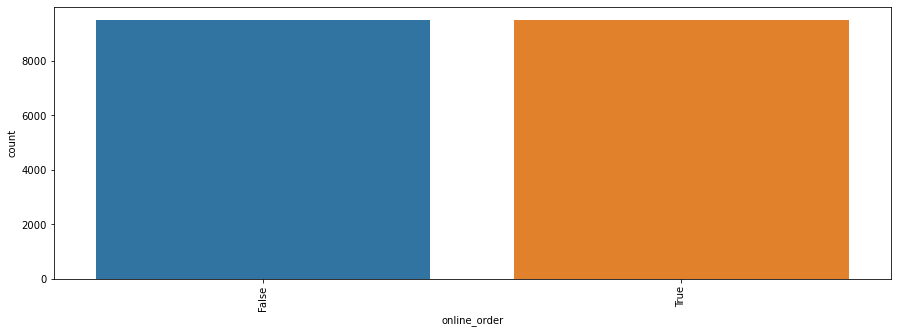

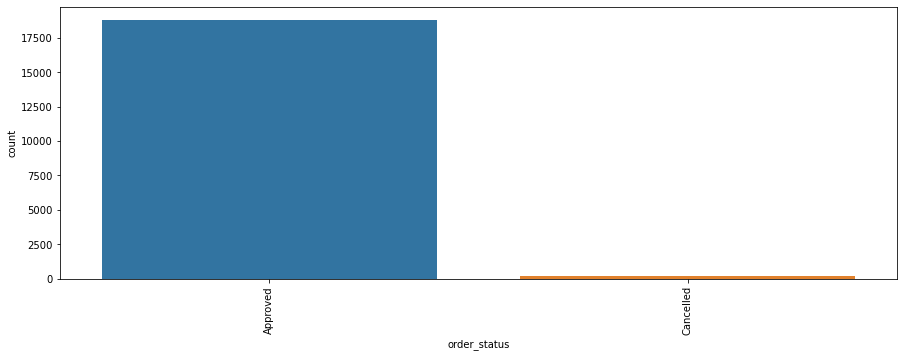

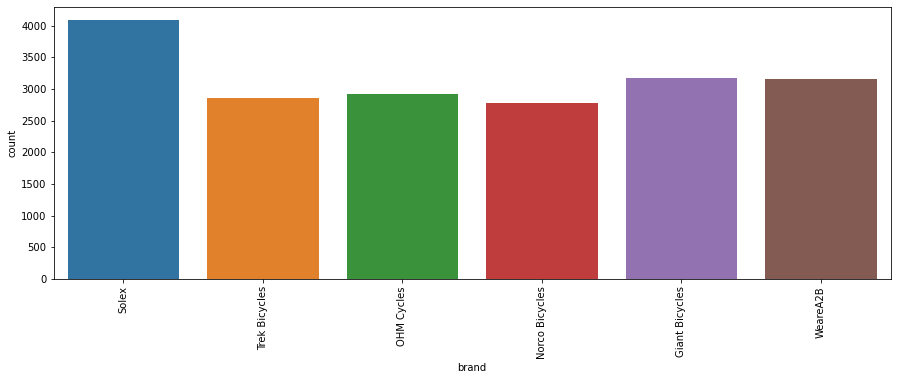

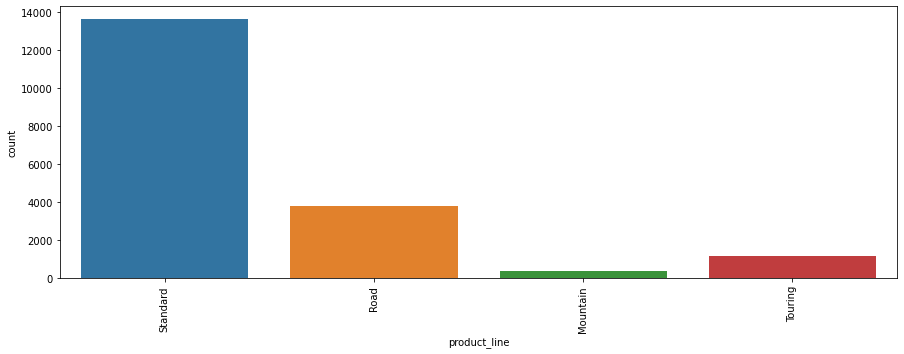

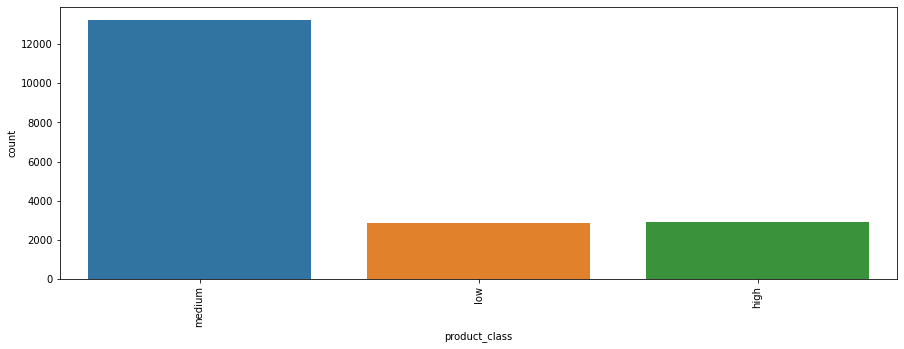

...

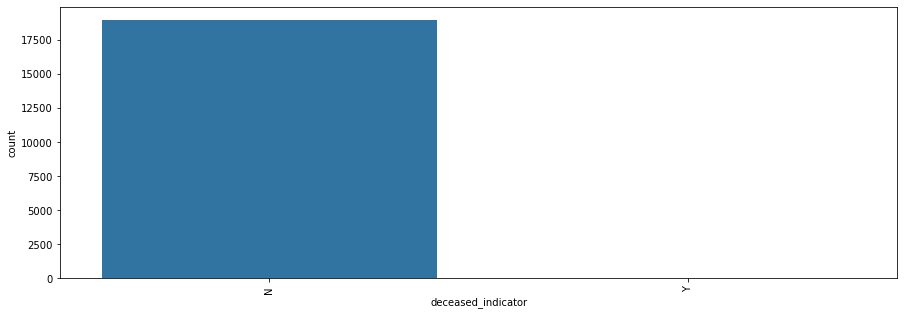

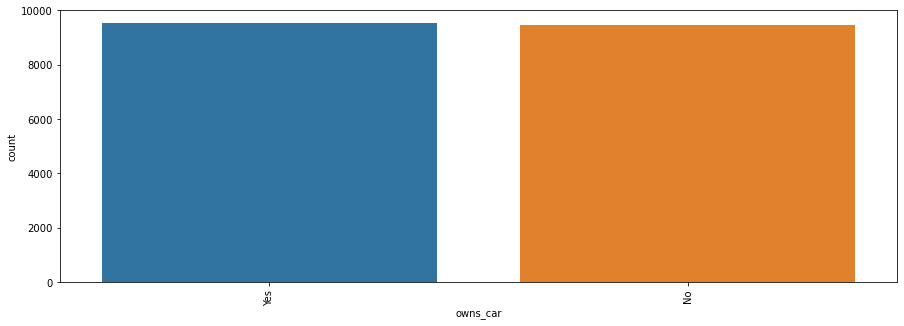

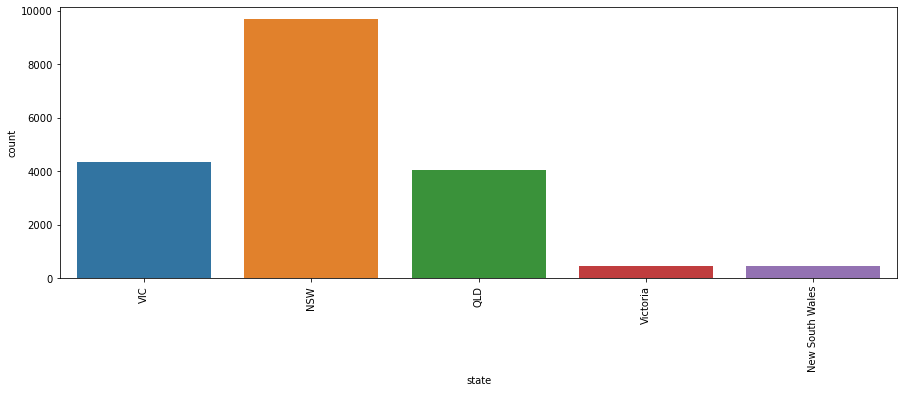

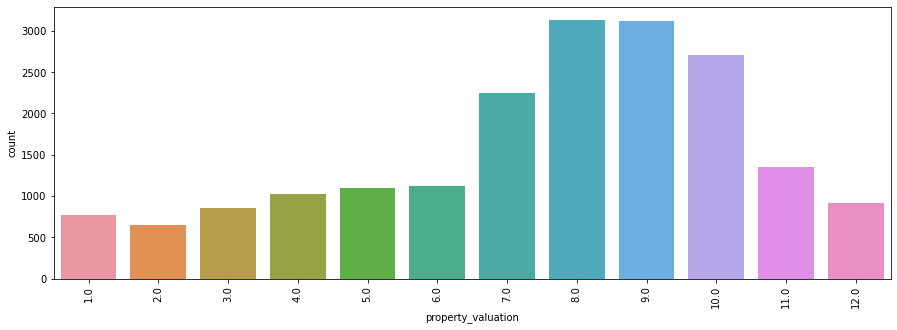

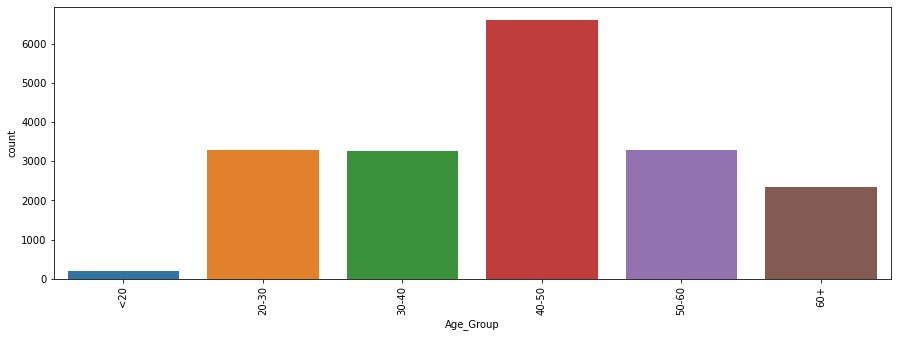

In [91]:
count_plot(CAT_VAR_list)

In [92]:
#Just checking the kind of distribution the variables  follow for categorical and continuous variables

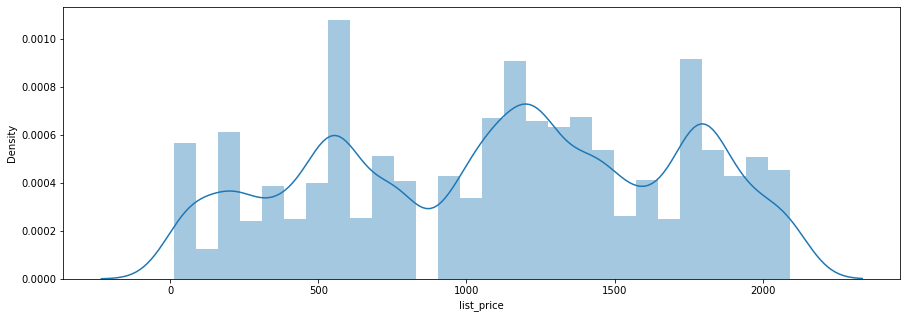

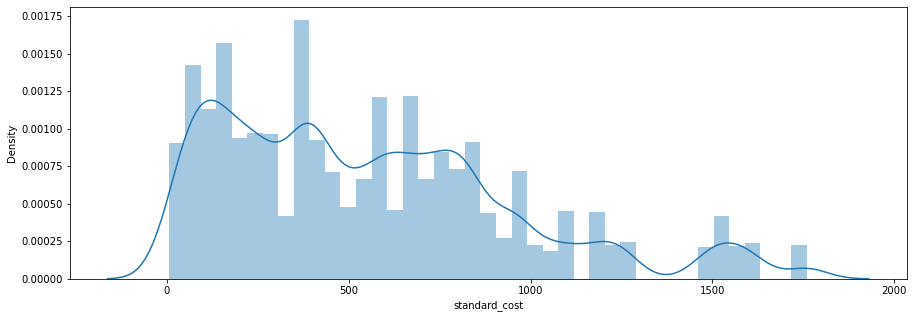

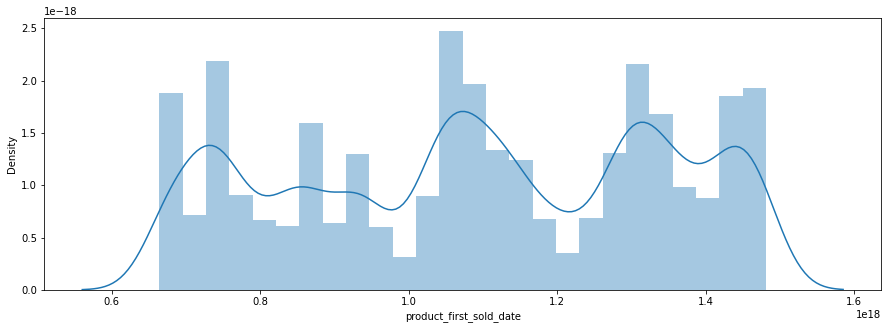

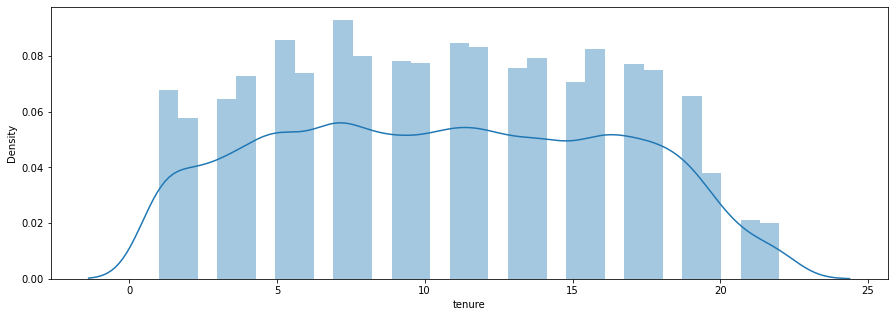

In [93]:
distribution_plot(CONT_VAR_list)

In [94]:
Transaction_DataFrame.job_title.value_counts()

other_Job_title                         2264
Social Worker                            215
Business Systems Development Analyst     202
Internal Auditor                         201
Legal Assistant                          198
Nuclear Power Engineer                   197
Assistant Professor                      196
Chemical Engineer                        191
Associate Professor                      190
Tax Accountant                           190
Executive Secretary                      189
Speech Pathologist                       187
Administrative Officer                   183
Clinical Specialist                      180
Assistant Media Planner                  180
VP Marketing                             180
Recruiting Manager                       178
Information Systems Manager              178
Research Nurse                           177
General Manager                          175
Product Engineer                         173
Junior Executive                         172
VP Product

## Bivariate Analysis 

In [95]:
Transaction_DataFrame["Profit"] = Transaction_DataFrame["list_price"] - Transaction_DataFrame["standard_cost"]

In [96]:
def bar_plot_profit(VAR):
    for VAR in CAT_VAR_list:
        plt.figure(figsize = (15,5))
        sns.barplot(x = VAR, y = "Profit", data = Transaction_DataFrame)

In [97]:
def bar_last_3yr_purchase(VAR):
    for VAR in CAT_VAR_list:
        plt.figure(figsize = (15,5))
        sns.barplot(x = VAR, y = "past_3_years_bike_related_purchases", data = Transaction_DataFrame)

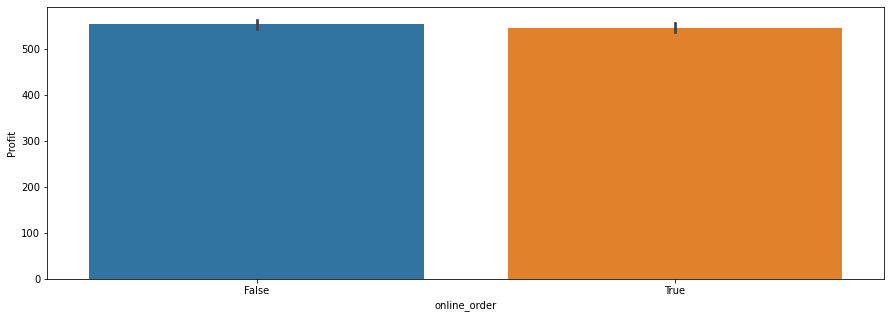

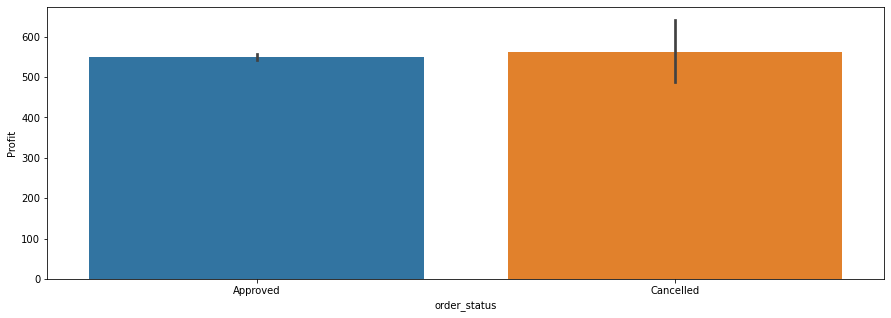

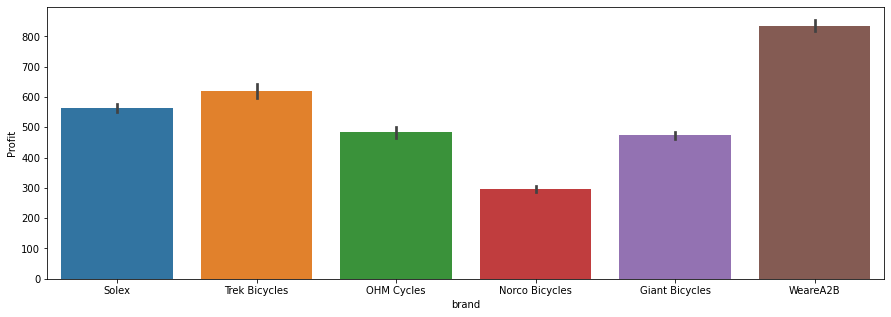

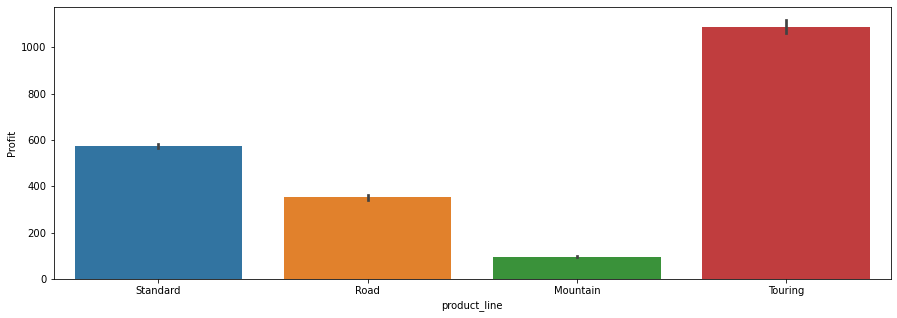

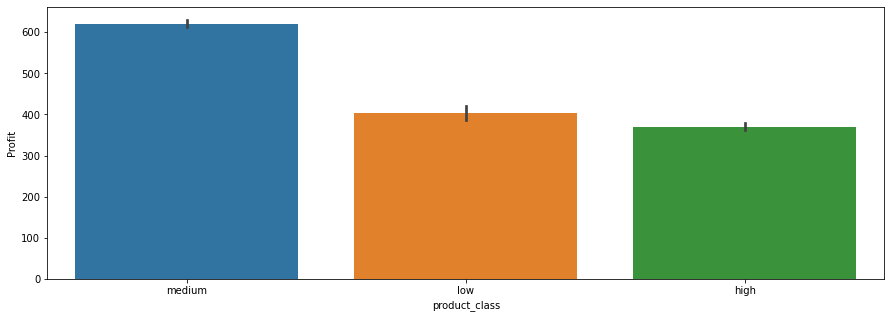

...

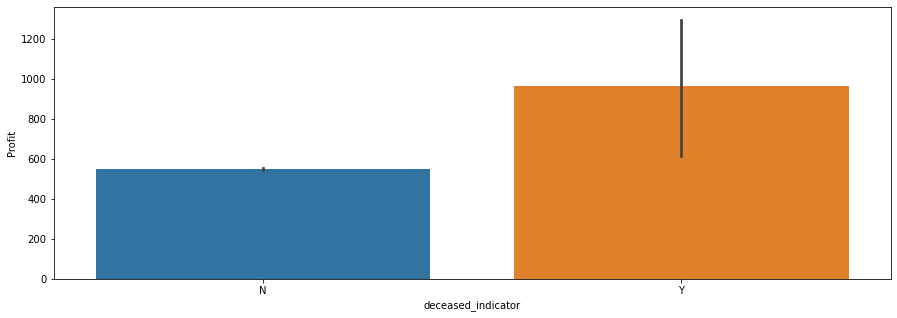

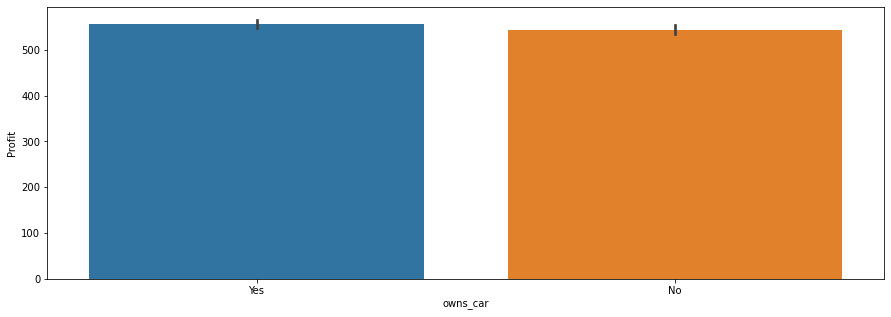

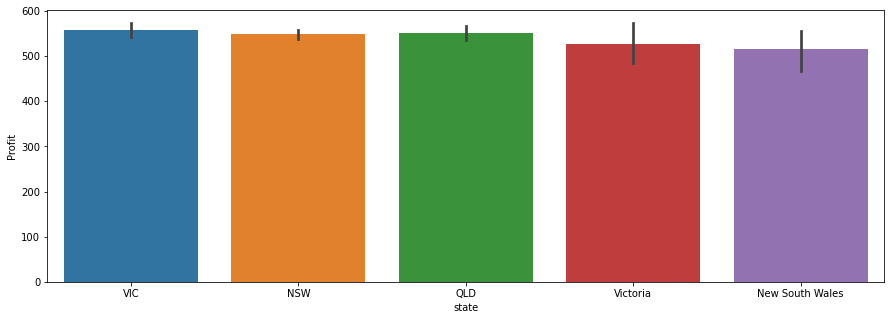

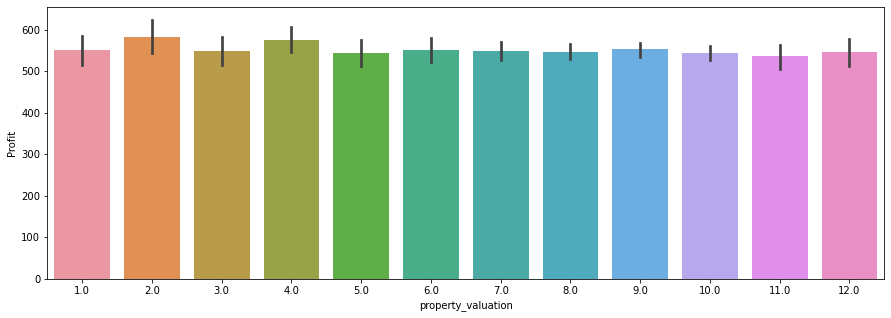

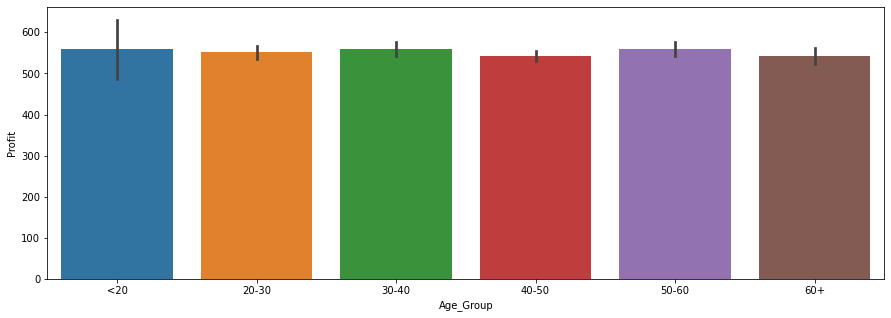

In [98]:
bar_plot_profit(CAT_VAR_list)

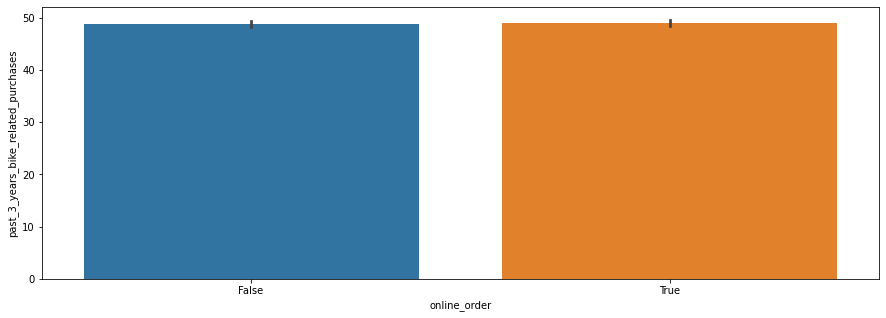

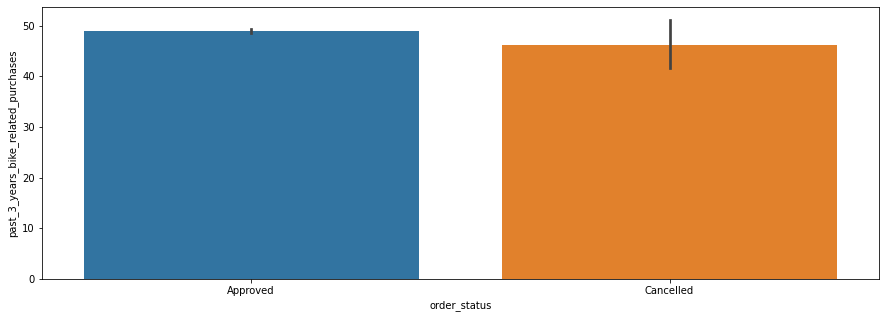

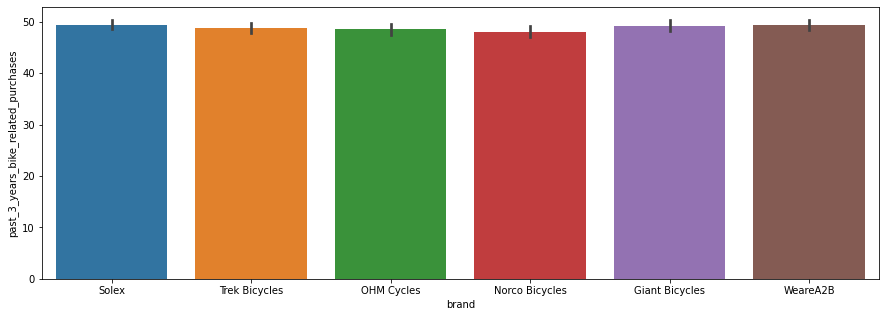

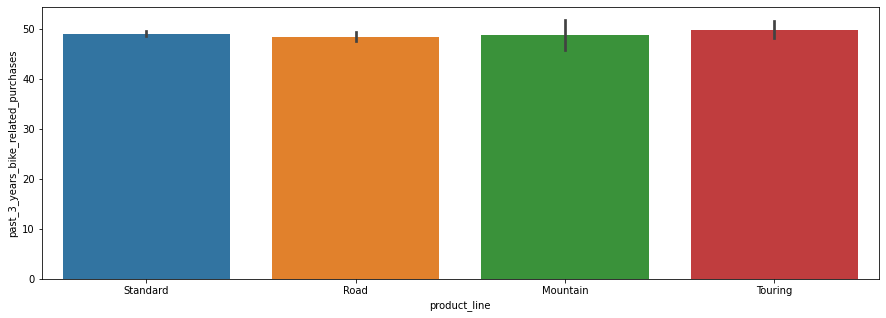

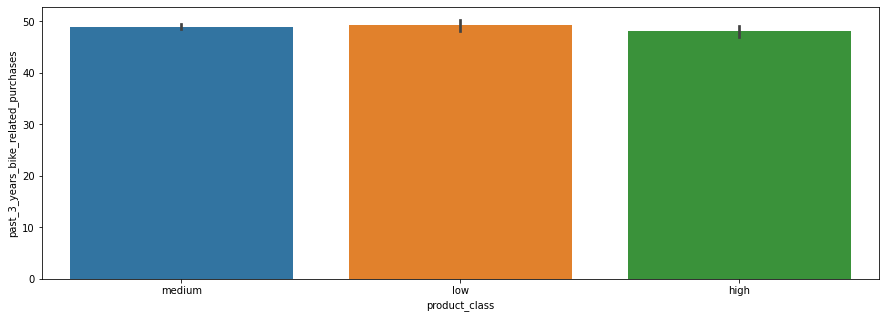

...

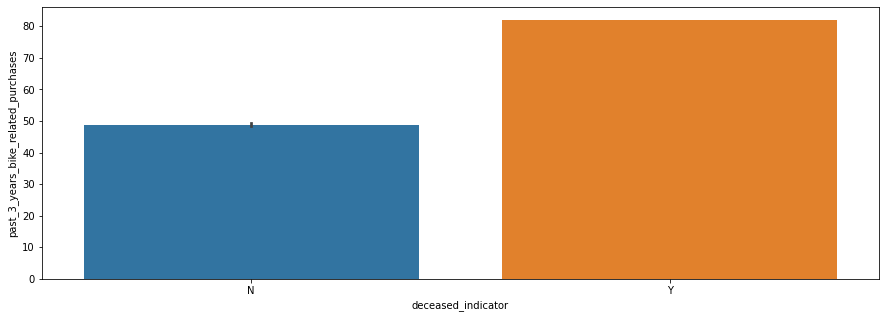

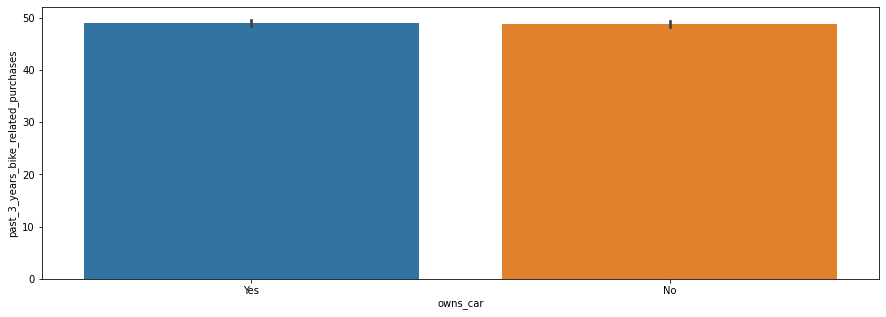

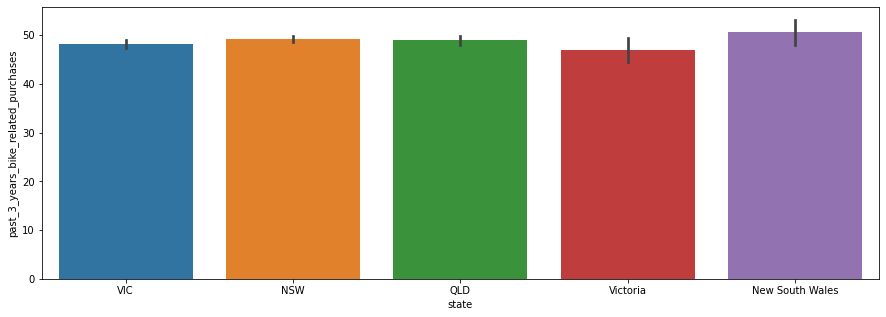

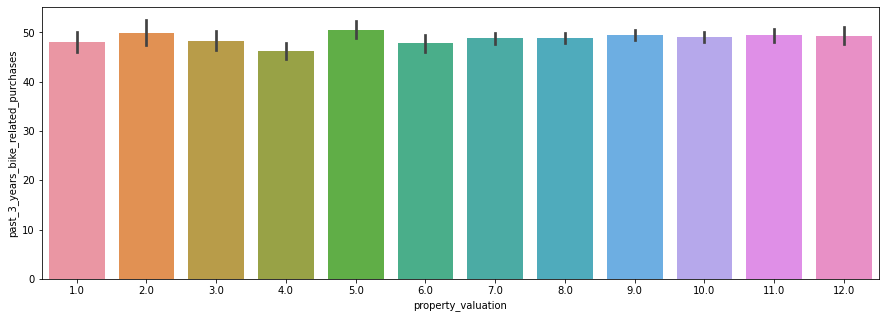

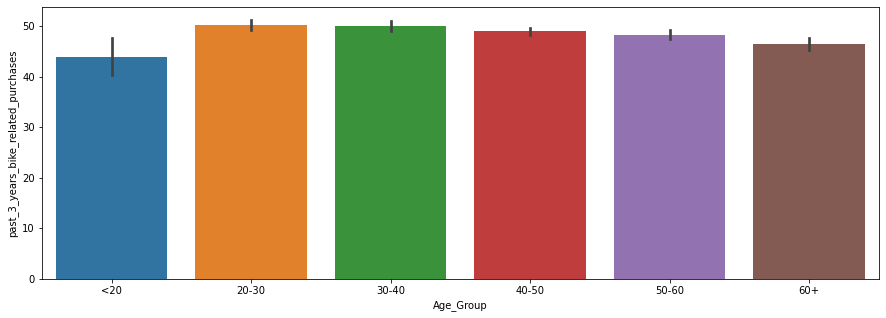

In [99]:
bar_last_3yr_purchase(CAT_VAR_list)

<AxesSubplot:xlabel='0', ylabel='0'>

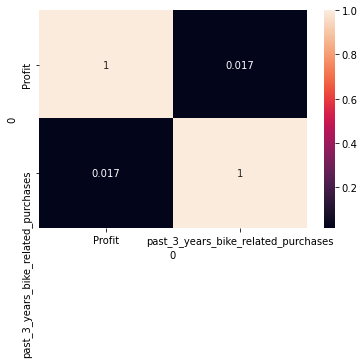

In [100]:
sns.heatmap((Transaction_DataFrame[["Profit", "past_3_years_bike_related_purchases"]]).corr(), annot= True)

In [101]:
Transaction_DataFrame.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date', 'gender',
       'past_3_years_bike_related_purchases', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'Age', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Age_Group', 'Profit'],
      dtype='object', name=0)

In [102]:
Transaction_DataFrame.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,gender,past_3_years_bike_related_purchases,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Age,address,postcode,state,country,property_valuation,Age_Group,Profit
0,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.489998,53.619999,2012-12-02,Male,19.0,Software Engineer I,Financial Services,Mass Customer,N,Yes,10.0,66.0,984 Hoepker Court,3064.0,VIC,Australia,6.0,60+,17.869999
1,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.469971,388.920013,2014-03-03,Female,89.0,Clinical Specialist,Health,Mass Customer,N,Yes,10.0,42.0,4 Shopko Circle,2196.0,NSW,Australia,5.0,40-50,1702.549927
2,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.430054,248.820007,1999-07-20,Male,9.0,Desktop Support Technician,Retail,Affluent Customer,N,No,22.0,44.0,586 Miller Parkway,2835.0,NSW,Australia,1.0,40-50,1544.610107
3,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.459961,381.100006,1998-12-16,Male,83.0,Staff Scientist,Financial Services,Mass Customer,N,No,16.0,59.0,1617 Harper Parkway,2096.0,NSW,Australia,10.0,50-60,817.359985
4,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.300049,709.479980,2015-08-10,Female,29.0,other_Job_title,Retail,Affluent Customer,N,Yes,2.0,25.0,0601 Stephen Place,2292.0,NSW,Australia,7.0,20-30,1055.820068


## Multivariate analysis 
-We can  consider the profit to be our target variable in this case .

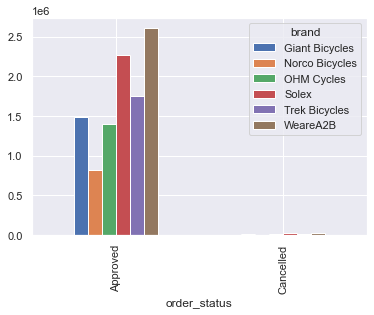

In [103]:
sns.set()
pd.pivot_table(data = Transaction_DataFrame, index ="order_status", columns= "brand", values = "Profit", aggfunc= np.sum).plot(kind = "bar")

plt.show()

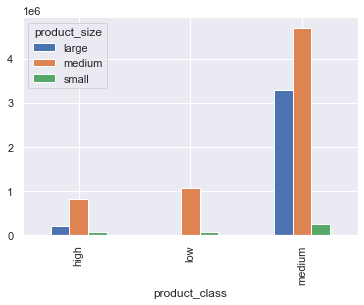

In [104]:
pd.pivot_table(data = Transaction_DataFrame, index ="product_class", columns= "product_size", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

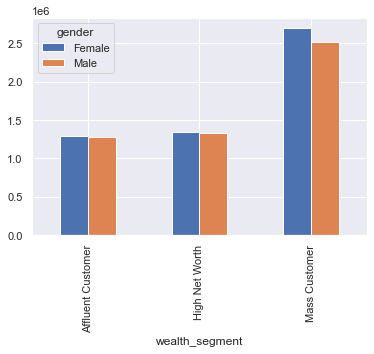

In [105]:
pd.pivot_table(data = Transaction_DataFrame, index ="wealth_segment", columns= "gender", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

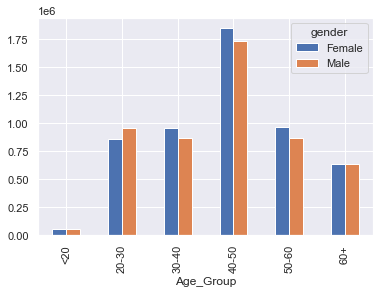

In [106]:
pd.pivot_table(data = Transaction_DataFrame, index ="Age_Group", columns= "gender", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

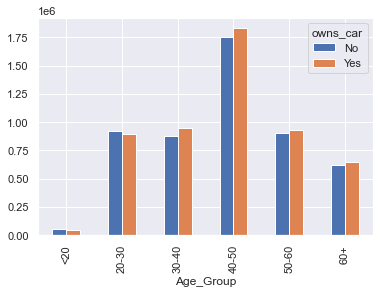

In [107]:

pd.pivot_table(data = Transaction_DataFrame, index ="Age_Group", columns= "owns_car", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

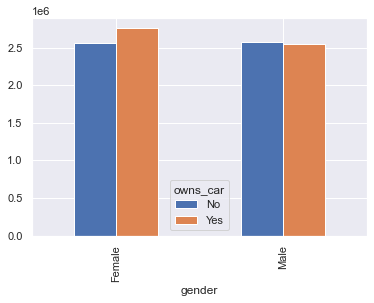

In [108]:
pd.pivot_table(data = Transaction_DataFrame, index ="gender", columns= "owns_car", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

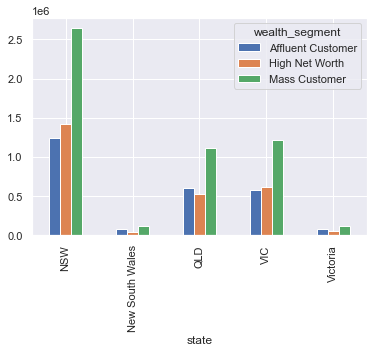

In [109]:
pd.pivot_table(data = Transaction_DataFrame, index ="state", columns= "wealth_segment", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

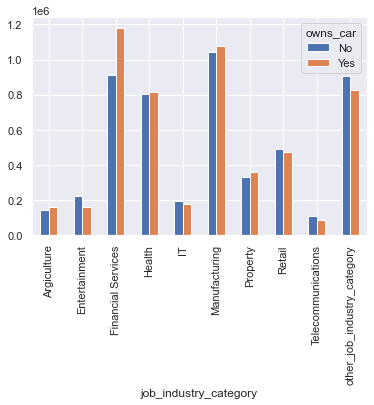

In [110]:
data = pd.pivot_table(data = Transaction_DataFrame, index ="job_industry_category", columns= "owns_car", values = "Profit", aggfunc= np.sum).plot(kind = "bar")
plt.show()

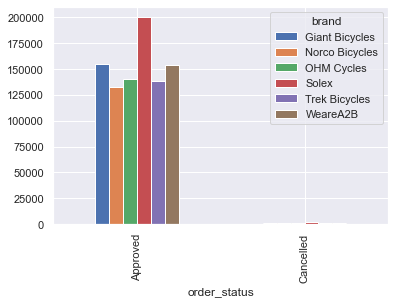

In [111]:
pd.pivot_table(data = Transaction_DataFrame, index ="order_status", columns= "brand", values = "past_3_years_bike_related_purchases", aggfunc= np.sum).plot(kind = "bar")
plt.show()

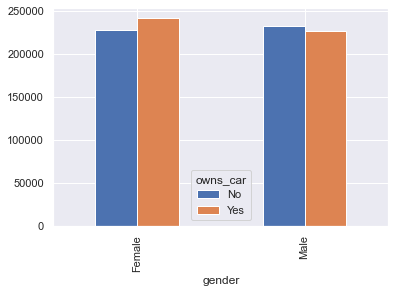

In [112]:
pd.pivot_table(data = Transaction_DataFrame, index ="gender", columns= "owns_car", values = "past_3_years_bike_related_purchases", aggfunc= np.sum).plot(kind = "bar")
plt.show()

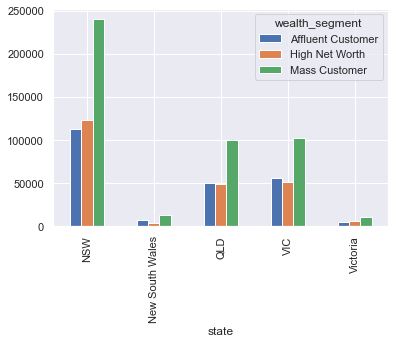

In [113]:
pd.pivot_table(data = Transaction_DataFrame, index ="state", columns= "wealth_segment", values = "past_3_years_bike_related_purchases", aggfunc= np.sum).plot(kind = "bar")
plt.show()

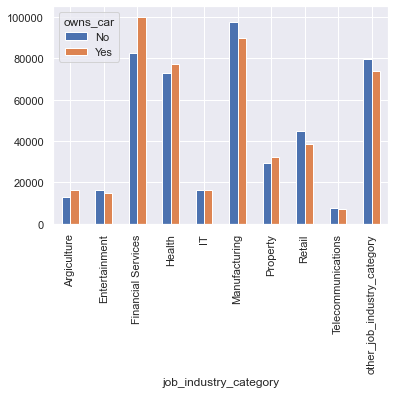

In [114]:
pd.pivot_table(data = Transaction_DataFrame, index ="job_industry_category", columns= "owns_car", values = "past_3_years_bike_related_purchases", aggfunc= np.sum).plot(kind = "bar")
plt.show()

RFM - Stands for Recency, Frequency and Monetary . This is a marketing technique that we will use to carry out our analysis further . This helps us know who is the most valuable customer . 
- Recency - stands for the most recent transaction that was made by the customer.
- Frequency- tells us which customer had the most buys over a period of time and who buys more.
- Monetary- -Tells us which customer in the recent past has spent the most money.

In [115]:
rfm_amount = Transaction_DataFrame.groupby("customer_id")[["list_price"]].sum()
rfm_amount.reset_index(inplace = True)
rfm_amount.columns = ["customer_id", "Monetary"]
rfm_amount.Monetary = rfm_amount.Monetary.astype("float64").round(2)
rfm_amount.head()

,customer_id,Monetary
0,1,9084.45
1,2,4149.07
2,4,1047.72
3,5,5903.20
4,6,5931.69


In [116]:
rfm_Frequency = Transaction_DataFrame.groupby("customer_id")[["transaction_id"]].count()
rfm_Frequency.reset_index(inplace = True)
rfm_Frequency.columns = ["customer_id", "Frequency"]
rfm_Frequency.head()

,customer_id,Frequency
0,1,11
1,2,3
2,4,2
3,5,6
4,6,5


In [117]:
max_date = max(Transaction_DataFrame["transaction_date"])
max_date

Timestamp('2017-12-30 00:00:00')

In [118]:
Transaction_DataFrame["diff"] = max_date - Transaction_DataFrame["transaction_date"]
Transaction_DataFrame.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,gender,past_3_years_bike_related_purchases,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Age,address,postcode,state,country,property_valuation,Age_Group,Profit,diff
0,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.489998,53.619999,2012-12-02,Male,19.0,Software Engineer I,Financial Services,Mass Customer,N,Yes,10.0,66.0,984 Hoepker Court,3064.0,VIC,Australia,6.0,60+,17.869999,308 days
1,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.469971,388.920013,2014-03-03,Female,89.0,Clinical Specialist,Health,Mass Customer,N,Yes,10.0,42.0,4 Shopko Circle,2196.0,NSW,Australia,5.0,40-50,1702.549927,223 days
2,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.430054,248.820007,1999-07-20,Male,9.0,Desktop Support Technician,Retail,Affluent Customer,N,No,22.0,44.0,586 Miller Parkway,2835.0,NSW,Australia,1.0,40-50,1544.610107,75 days
3,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.459961,381.100006,1998-12-16,Male,83.0,Staff Scientist,Financial Services,Mass Customer,N,No,16.0,59.0,1617 Harper Parkway,2096.0,NSW,Australia,10.0,50-60,817.359985,121 days
4,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.300049,709.479980,2015-08-10,Female,29.0,other_Job_title,Retail,Affluent Customer,N,Yes,2.0,25.0,0601 Stephen Place,2292.0,NSW,Australia,7.0,20-30,1055.820068,90 days


In [119]:
rfm_Recency = Transaction_DataFrame.groupby("customer_id")[["diff"]].min()
rfm_Recency.reset_index(inplace = True)
rfm_Recency.columns = ["customer_id", "Recency"]
rfm_Recency["Recency"] = rfm_Recency.Recency.dt.days
rfm_Recency.head()

,customer_id,Recency
0,1,7
1,2,128
2,4,195
3,5,16
4,6,64


In [120]:
rfm = rfm_amount.merge(rfm_Frequency,how = "inner", on = "customer_id")
rfm = rfm.merge(rfm_Recency,how = "inner", on = "customer_id")

In [121]:
rfm.head()

,customer_id,Monetary,Frequency,Recency
0,1,9084.45,11,7
1,2,4149.07,3,128
2,4,1047.72,2,195
3,5,5903.20,6,16
4,6,5931.69,5,64


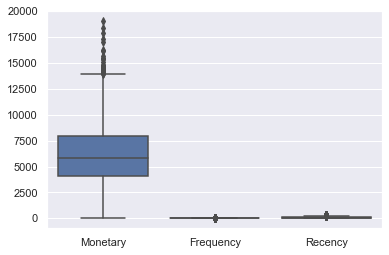

In [122]:
sns.boxplot(data = rfm[["Monetary", "Frequency", "Recency"]])
plt.show()

In [123]:
# Removing outliers
## removing Monetary column outliers
Q1 = rfm.Monetary.quantile(0.05)
Q3 = rfm.Monetary.quantile(0.95)
IQR = Q3-Q1
rfm = rfm[(rfm.Monetary >= Q1 - 1.5*IQR) & (rfm.Monetary <= Q3+1.5*IQR)]

##removing frequency column outliers

Q1 = rfm.Frequency.quantile(0.05)
Q3 = rfm.Frequency.quantile(0.95)
IQR = Q3-Q1
rfm = rfm[(rfm.Frequency >= Q1 - 1.5*IQR) & (rfm.Frequency <= Q3+1.5*IQR)]

## removing Recency column outliers

Q1 = rfm.Recency.quantile(0.05)
Q3 = rfm.Recency.quantile(0.95)
IQR = Q3-Q1
rfm = rfm[(rfm.Recency >= Q1 - 1.5*IQR) & (rfm.Recency <= Q3+1.5*IQR)]


### Model Building Stage

#### Scaling -

In [124]:
import sklearn
from sklearn.preprocessing import StandardScaler

In [125]:
scaler = StandardScaler()
rfm_df = rfm[["Monetary", "Frequency", "Recency"]]
rfm_df_scaled = scaler.fit_transform(rfm_df)

In [126]:
rfm_df_scaled = pd.DataFrame(rfm_df_scaled)
rfm_df_scaled.columns = ["Monetary", "Frequency", "Recency"]
rfm_df_scaled.head()

,Monetary,Frequency,Recency
0,1.006050,2.372424,-0.939531
1,-0.688080,-1.119899,1.100656
2,-1.752657,-1.556439,2.230346
3,-0.085953,0.189722,-0.787782
4,-0.076174,-0.246818,0.021549


#### Model Building - 

In [127]:
# Modelling - Kmeans Clustering 
from sklearn.cluster import KMeans

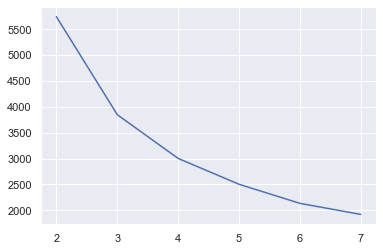

In [128]:
#ssd = sum of squared distance
ssd = []
range_n_cluster = [2,3,4,5,6,7]
for n in range_n_cluster:
    kmeans = KMeans(n_clusters= n, max_iter= 300)
    kmeans.fit(rfm_df_scaled)
    
    ssd.append([n, kmeans.inertia_])
ssd_df = pd.DataFrame(ssd)
    
plt.plot(ssd_df[0], ssd_df[1])
plt.show()

Inference-By looking silhouette analysis, we see the highest peak is at k =4 and in sum of squared distances graph , we see that the elbow is in the range of 3 to 5 , so let us take k as 4 , Choosing 4 is helping in better analysis and treatment.

### Silhouette Analysis

$$\text{silhouette score}=\frac{p-q}{max(p,q)}$$

$p$ is the mean distance to the points in the nearest cluster that the data point is not a part of

$q$ is the mean intra-cluster distance to all the points in its own cluster.

* The value of the silhouette score range lies between -1 to 1. 

* A score closer to 1 indicates that the data point is very similar to other data points in the cluster, 

* A score closer to -1 indicates that the data point is not similar to the data points in its cluster.

In [182]:
from sklearn.metrics import silhouette_score

ss = []
for k in range(2,11):
    kmean = KMeans(n_clusters=k).fit(rfm_df_scaled )
    ss.append([k, silhouette_score(rfm_df_scaled , kmean.labels_)])

sil = pd.DataFrame(ss)

In [183]:
sil

,0,1
0,2,0.375269
1,3,0.381049
2,4,0.324245
3,5,0.332180
4,6,0.310296
5,7,0.294062
6,8,0.268452
7,9,0.275100
8,10,0.283379


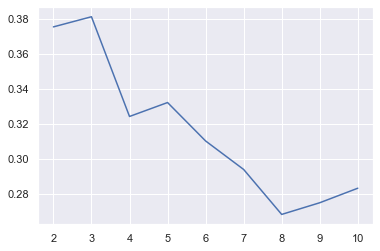

In [184]:
plt.plot(sil[0], sil[1]);

In [187]:
# silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(rfm_df_scaled, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.375431015172395
For n_clusters=3, the silhouette score is 0.38107756650905766
For n_clusters=4, the silhouette score is 0.32416370983122283
For n_clusters=5, the silhouette score is 0.3323359616600582
For n_clusters=6, the silhouette score is 0.31039077335987036
For n_clusters=7, the silhouette score is 0.29493677907466204
For n_clusters=8, the silhouette score is 0.2682931584082647


In [129]:
kmeans = KMeans(n_clusters= 4, max_iter= 300, random_state= 50)
kmeans.fit(rfm_df_scaled)

KMeans(n_clusters=4, random_state=50)

In [130]:
rfm["cluster_id"] = kmeans.labels_ 
rfm.head()

,customer_id,Monetary,Frequency,Recency,cluster_id
0,1,9084.45,11,7,0
1,2,4149.07,3,128,2
2,4,1047.72,2,195,2
3,5,5903.20,6,16,3
4,6,5931.69,5,64,3


<AxesSubplot:xlabel='cluster_id', ylabel='Monetary'>

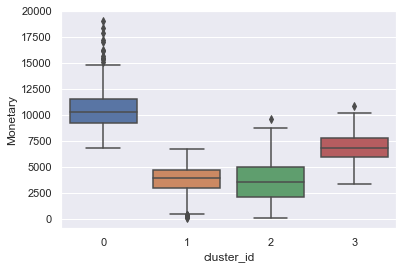

In [131]:
sns.boxplot(x = "cluster_id", y = "Monetary", data = rfm)

<AxesSubplot:xlabel='cluster_id', ylabel='Frequency'>

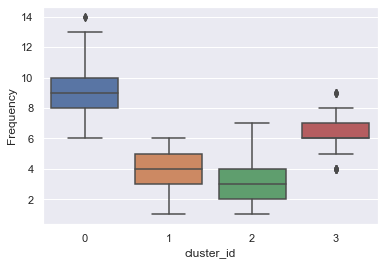

In [132]:
sns.boxplot(x = "cluster_id", y = "Frequency", data = rfm)

<AxesSubplot:xlabel='cluster_id', ylabel='Recency'>

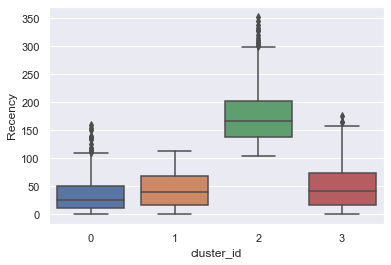

In [133]:
sns.boxplot(x = "cluster_id", y = "Recency", data = rfm)

<AxesSubplot:xlabel='Monetary', ylabel='Recency'>

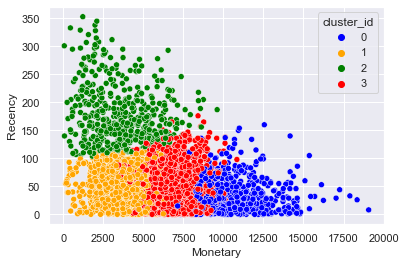

In [196]:
# scatterplot 
sns.scatterplot(x='Monetary',y='Recency',hue='cluster_id',legend='full',data=rfm,palette=['blue','orange','green','red'])

<AxesSubplot:xlabel='Monetary', ylabel='Frequency'>

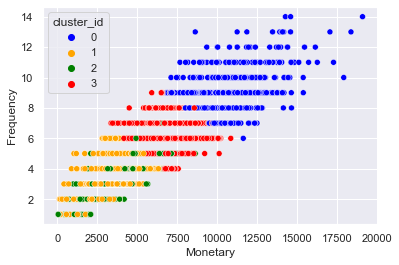

In [194]:
# scatterplot 
sns.scatterplot(x='Monetary',y='Frequency',hue='cluster_id',legend='full',data=rfm,palette=['blue','orange','green','red'])

In [134]:
#cluster = 0 - Platinum
#cluster = 1 - Lead
#cluster = 2 - Iron
#cluster = 3 - Gold

In [135]:
customer_value = []
for x in rfm["cluster_id"]:
    if x == 0:
        customer_value.append("Platinum")
    elif x == 1:
        customer_value.append("Lead")
    elif x == 2:
        customer_value.append("Iron")
    else:
        customer_value.append("Gold")

In [136]:
rfm["customer_value"] = customer_value

In [137]:
rfm.shape

(3410, 6)

In [138]:
Transaction_DataFrame.shape

(18978, 30)

In [139]:
Transaction_DataFrame.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,gender,past_3_years_bike_related_purchases,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Age,address,postcode,state,country,property_valuation,Age_Group,Profit,diff
0,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.489998,53.619999,2012-12-02,Male,19.0,Software Engineer I,Financial Services,Mass Customer,N,Yes,10.0,66.0,984 Hoepker Court,3064.0,VIC,Australia,6.0,60+,17.869999,308 days
1,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.469971,388.920013,2014-03-03,Female,89.0,Clinical Specialist,Health,Mass Customer,N,Yes,10.0,42.0,4 Shopko Circle,2196.0,NSW,Australia,5.0,40-50,1702.549927,223 days
2,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.430054,248.820007,1999-07-20,Male,9.0,Desktop Support Technician,Retail,Affluent Customer,N,No,22.0,44.0,586 Miller Parkway,2835.0,NSW,Australia,1.0,40-50,1544.610107,75 days
3,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.459961,381.100006,1998-12-16,Male,83.0,Staff Scientist,Financial Services,Mass Customer,N,No,16.0,59.0,1617 Harper Parkway,2096.0,NSW,Australia,10.0,50-60,817.359985,121 days
4,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.300049,709.479980,2015-08-10,Female,29.0,other_Job_title,Retail,Affluent Customer,N,Yes,2.0,25.0,0601 Stephen Place,2292.0,NSW,Australia,7.0,20-30,1055.820068,90 days


In [140]:
Transaction_DataFrame = Transaction_DataFrame.merge(rfm[["customer_id","customer_value"]], how = "left", on = "customer_id")

In [141]:
Transaction_DataFrame.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,gender,past_3_years_bike_related_purchases,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Age,address,postcode,state,country,property_valuation,Age_Group,Profit,diff,customer_value
0,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.489998,53.619999,2012-12-02,Male,19.0,Software Engineer I,Financial Services,Mass Customer,N,Yes,10.0,66.0,984 Hoepker Court,3064.0,VIC,Australia,6.0,60+,17.869999,308 days,Lead
1,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.469971,388.920013,2014-03-03,Female,89.0,Clinical Specialist,Health,Mass Customer,N,Yes,10.0,42.0,4 Shopko Circle,2196.0,NSW,Australia,5.0,40-50,1702.549927,223 days,Gold
2,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.430054,248.820007,1999-07-20,Male,9.0,Desktop Support Technician,Retail,Affluent Customer,N,No,22.0,44.0,586 Miller Parkway,2835.0,NSW,Australia,1.0,40-50,1544.610107,75 days,Gold
3,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.459961,381.100006,1998-12-16,Male,83.0,Staff Scientist,Financial Services,Mass Customer,N,No,16.0,59.0,1617 Harper Parkway,2096.0,NSW,Australia,10.0,50-60,817.359985,121 days,Gold
4,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.300049,709.479980,2015-08-10,Female,29.0,other_Job_title,Retail,Affluent Customer,N,Yes,2.0,25.0,0601 Stephen Place,2292.0,NSW,Australia,7.0,20-30,1055.820068,90 days,Platinum


In [142]:
Transaction_DataFrame.shape

(18978, 31)

In [143]:
Transaction_DataFrame.customer_value.value_counts()

Gold        7852
Platinum    5574
Lead        3946
Iron        1606
Name: customer_value, dtype: int64

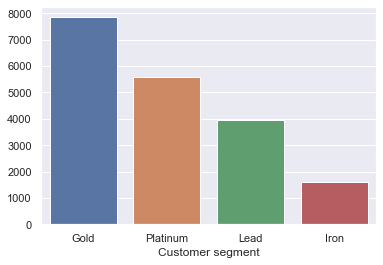

In [144]:
sns.barplot(x =Transaction_DataFrame.customer_value.value_counts().index, y = Transaction_DataFrame.customer_value.value_counts().values)
plt.xlabel("Customer segment")
plt.show()

In [145]:
Transaction_DataFrame[Transaction_DataFrame.customer_value == "Platinum"]

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,gender,past_3_years_bike_related_purchases,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,Age,address,postcode,state,country,property_valuation,Age_Group,Profit,diff,customer_value
4,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.300049,709.479980,2015-08-10,Female,29.0,other_Job_title,Retail,Affluent Customer,N,Yes,2.0,25.0,0601 Stephen Place,2292.0,NSW,Australia,7.0,20-30,1055.820068,90 days,Platinum
5,6,25,2339,2017-03-08,True,Approved,Giant Bicycles,Road,medium,medium,1538.989990,829.650024,2006-11-10,Male,3.0,Web Designer II,Property,Affluent Customer,N,Yes,16.0,63.0,7174 Thackeray Point,2153.0,NSW,Australia,10.0,60+,709.339966,297 days,Platinum
7,8,15,2459,2017-07-15,False,Approved,WeareA2B,Standard,medium,medium,1292.839966,13.440000,2009-04-12,Female,67.0,Quality Engineer,Manufacturing,High Net Worth,N,No,18.0,35.0,975 Annamark Hill,4034.0,QLD,Australia,6.0,30-40,1279.400024,168 days,Platinum
9,10,12,3262,2017-08-30,True,Approved,WeareA2B,Standard,medium,medium,1231.150024,161.600006,2004-08-17,Male,65.0,Product Engineer,Entertainment,Mass Customer,N,No,12.0,62.0,2558 Morningstar Center,4221.0,QLD,Australia,8.0,60+,1069.550049,122 days,Platinum
11,12,61,2783,2017-01-05,True,Approved,OHM Cycles,Standard,low,medium,71.160004,56.930000,2015-06-17,Male,14.0,Sales Representative,Retail,Affluent Customer,N,Yes,7.0,43.0,13392 Emmet Parkway,2171.0,NSW,Australia,9.0,40-50,14.230003,359 days,Platinum
12,13,35,1243,2017-02-26,True,Approved,Trek Bicycles,Standard,low,medium,1057.510010,154.399994,1994-07-12,Male,73.0,Research Assistant II,Retail,Mass Customer,N,No,8.0,68.0,2 Eliot Lane,2155.0,NSW,Australia,11.0,60+,903.109985,307 days,Platinum
13,14,16,2717,2017-09-10,False,Approved,Norco Bicycles,Standard,high,small,1661.920044,1479.109985,1994-09-09,Male,31.0,Registered Nurse,Health,Mass Customer,N,No,13.0,40.0,6994 Hanson Place,2580.0,NSW,Australia,5.0,30-40,182.810059,111 days,Platinum
17,19,54,2268,2017-04-06,True,Approved,WeareA2B,Standard,medium,medium,1292.839966,13.440000,2009-04-12,Female,66.0,Pharmacist,Health,Mass Customer,N,No,19.0,56.0,9574 David Lane,3218.0,VIC,Australia,8.0,50-60,1279.400024,268 days,Platinum
21,23,37,2001,2017-04-08,True,Approved,OHM Cycles,Standard,low,medium,1793.430054,248.820007,2015-05-21,Female,21.0,Analog Circuit Design manager,Manufacturing,Mass Customer,N,Yes,3.0,44.0,3 Bonner Point,2800.0,NSW,Australia,4.0,40-50,1544.610107,266 days,Platinum
22,24,82,515,2017-10-18,False,Approved,Giant Bicycles,Road,medium,medium,1538.989990,829.650024,2016-02-04,Female,55.0,Help Desk Operator,IT,High Net Worth,N,No,8.0,32.0,12845 Paget Lane,2026.0,NSW,Australia,12.0,30-40,709.339966,73 days,Platinum


In [146]:
Transaction_Platinum_DataFrame = Transaction_DataFrame[Transaction_DataFrame.customer_value == "Platinum"]

In [147]:
Transaction_Platinum_DataFrame.Age_Group.value_counts()

40-50    1964
20-30    1050
50-60     962
30-40     908
60+       644
<20        46
Name: Age_Group, dtype: int64

In [153]:
def platinum_bar(VAR):
    plt.figure(figsize = (14,7))
    sns.barplot(x = Transaction_Platinum_DataFrame[VAR].value_counts().index, 
                y = Transaction_Platinum_DataFrame[VAR].value_counts().values)
    plt.xticks(rotation = 90)

    plt.show()

In [154]:
New_Customer_List.columns

Index(['first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Rank', 'Value', 'Year', 'Age'],
      dtype='object', name=0)

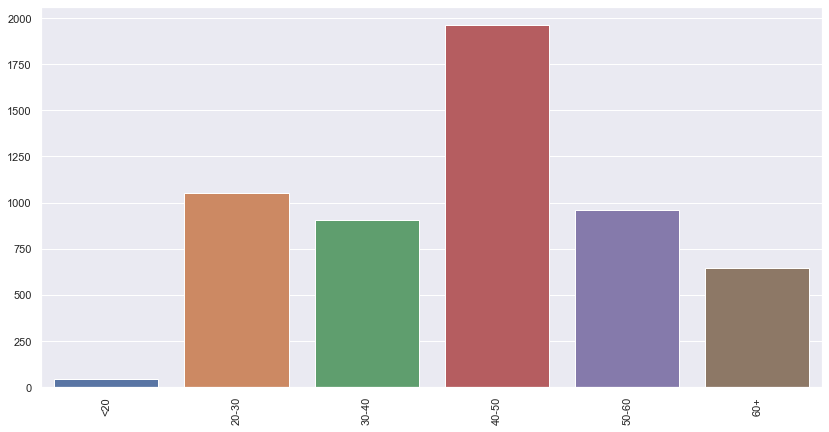

In [155]:
platinum_bar("Age_Group")

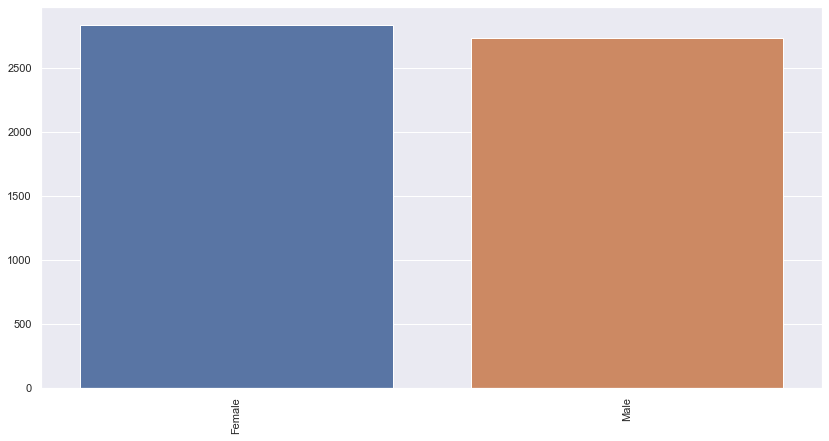

In [156]:
platinum_bar("gender")

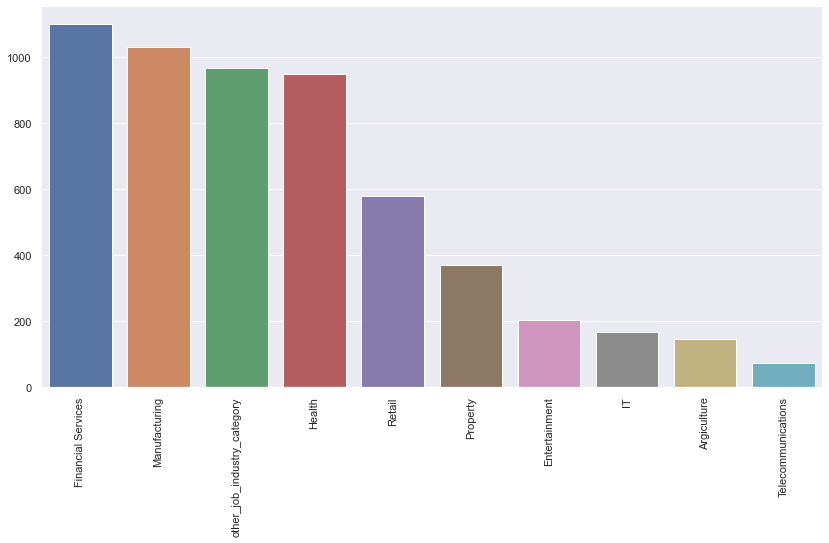

In [157]:
platinum_bar("job_industry_category")

In [158]:
Transaction_Platinum_DataFrame.job_industry_category.value_counts()

Financial Services             1098
Manufacturing                  1030
other_job_industry_category     967
Health                          948
Retail                          578
Property                        369
Entertainment                   202
IT                              165
Argiculture                     144
Telecommunications               73
Name: job_industry_category, dtype: int64

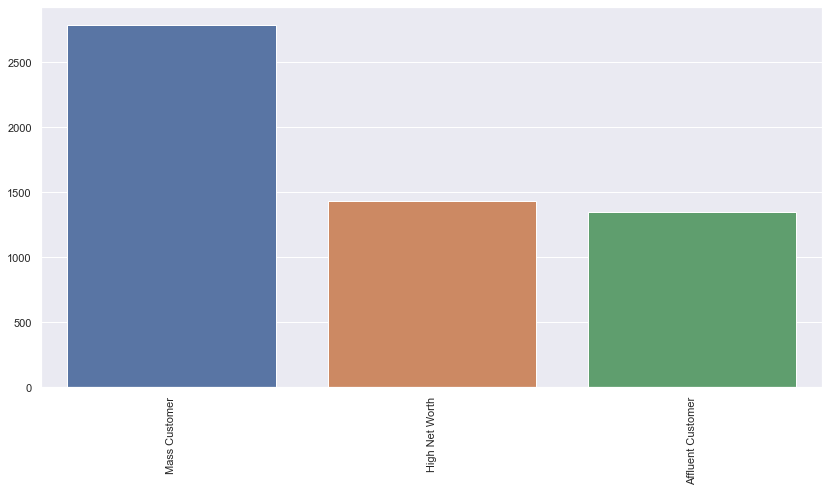

In [159]:
platinum_bar("wealth_segment")

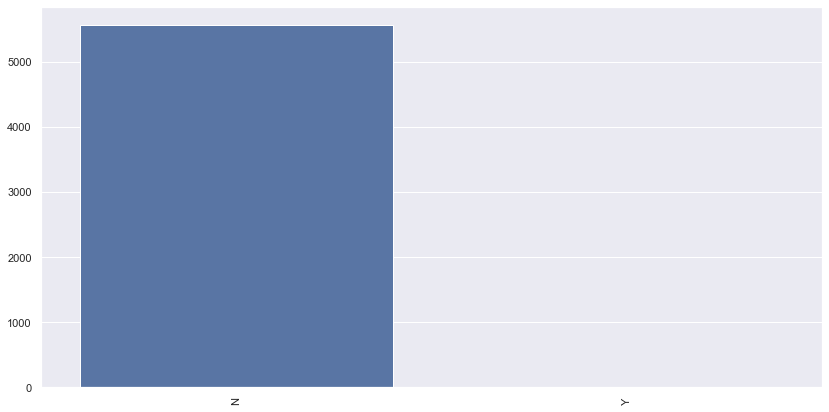

In [160]:
platinum_bar("deceased_indicator")

Inference - We do not want to work with the dead customer data

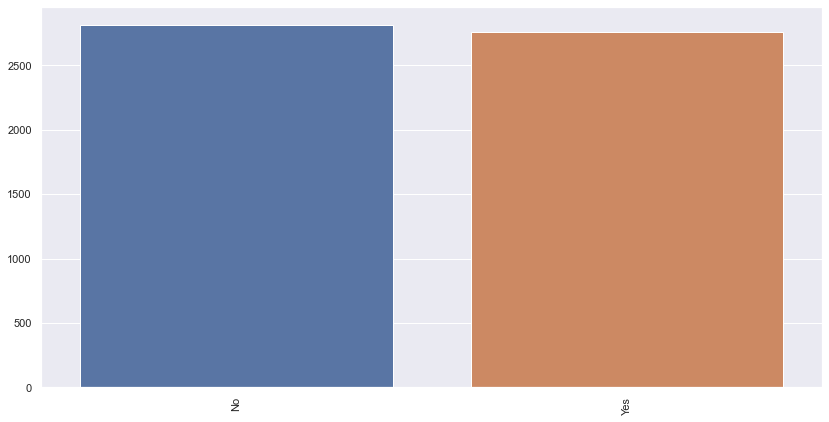

In [161]:
platinum_bar("owns_car")

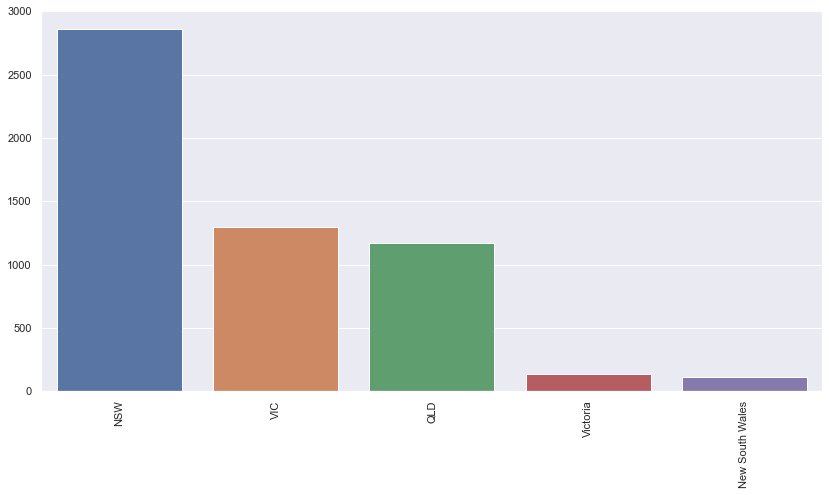

In [162]:
platinum_bar("state")

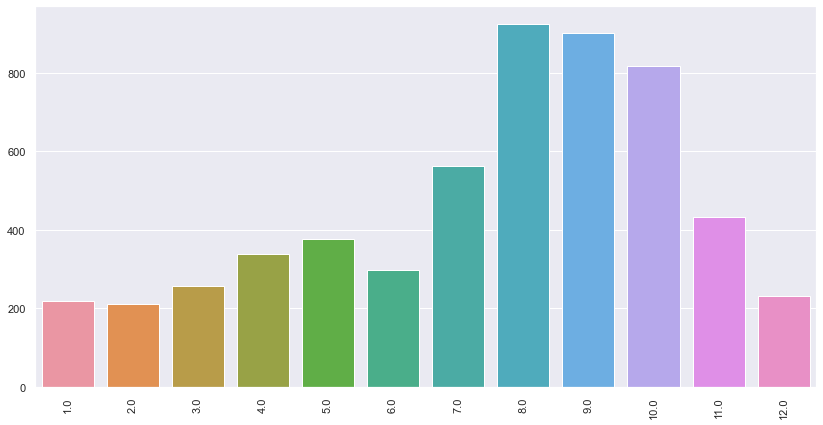

In [163]:
platinum_bar("property_valuation")

<AxesSubplot:xlabel='past_3_years_bike_related_purchases', ylabel='Density'>

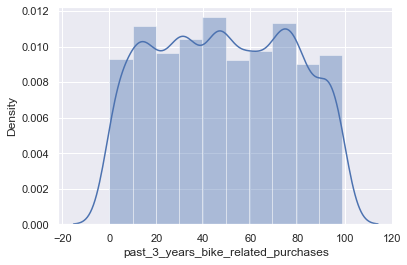

In [164]:
sns.distplot(Transaction_Platinum_DataFrame.past_3_years_bike_related_purchases, bins= 10)

Inference-
- age = 40-50
- job_industry_category = Financial, Manufacturing, Health
- wealth_segment = Mass_Customer
- deceased_indicator = n
- state = NSW
- property_valuation >=6

In [165]:
New_Customer_List.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 983 entries, 1 to 1000
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   first_name                           983 non-null    object        
 1   last_name                            954 non-null    object        
 2   gender                               983 non-null    object        
 3   past_3_years_bike_related_purchases  983 non-null    int64         
 4   DOB                                  983 non-null    datetime64[ns]
 5   job_title                            983 non-null    object        
 6   job_industry_category                983 non-null    object        
 7   wealth_segment                       983 non-null    object        
 8   deceased_indicator                   983 non-null    object        
 9   owns_car                             983 non-null    object        
 10  tenure       

In [166]:
# Binning the continious variable Age 
cut_bins = [0, 20, 30,40,50, 60, max(New_Customer_List.Age)]
cut_labels = ["<20", "20-30", "30-40","40-50", "50-60", "60+"]
New_Customer_List['Age_Group'] = pd.cut(New_Customer_List['Age'], bins=cut_bins, labels=cut_labels)

In [167]:
New_high_value_Customers = New_Customer_List[(New_Customer_List["Age_Group"] == "40-50") & 
                                      (New_Customer_List["wealth_segment"] == "Mass Customer") &
                                      (New_Customer_List["deceased_indicator"] == "N") &
                                      (New_Customer_List["state"] == "NSW")]
New_high_value_Customers = New_high_value_Customers[New_high_value_Customers.job_industry_category.isin(["Financial Services",
                                                                                                       "Manufacturing", "Health"])]

In [168]:
New_high_value_Customers.shape

(37, 21)

In [ ]:
#Model Building using Hierarchical Clustering 


In [198]:
rfm_df_scaled.head()

,Monetary,Frequency,Recency
0,1.006050,2.372424,-0.939531
1,-0.688080,-1.119899,1.100656
2,-1.752657,-1.556439,2.230346
3,-0.085953,0.189722,-0.787782
4,-0.076174,-0.246818,0.021549


In [201]:
# To perform Hierarchical clustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

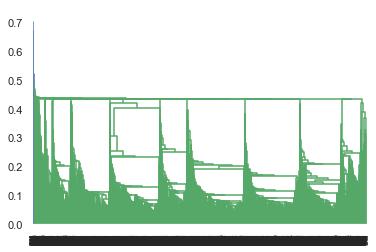

In [202]:
# single linkage
mergings = linkage(rfm_df_scaled, method="single", metric='euclidean')
dendrogram(mergings)
plt.show()

Inference-By single method heirarchical clustering things are not clear, so let us go for complete heirarchical clustering method.

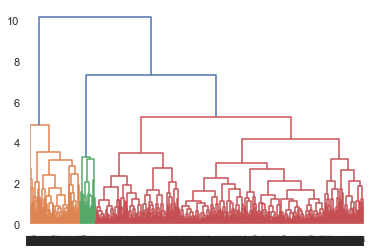

In [203]:
# complete linkage
mergings = linkage(rfm_df_scaled, method="complete", metric='euclidean')
dendrogram(mergings)
plt.show()

In [204]:
# 4 clusters
cluster_labels = cut_tree(mergings, n_clusters=4).reshape(-1, )
cluster_labels

array([0, 1, 2, ..., 3, 3, 3])

In [205]:
# assign cluster labels
rfm['cluster_id'] = cluster_labels
rfm.head()

,customer_id,Monetary,Frequency,Recency,cluster_id,customer_value
0,1,9084.45,11,7,0,Platinum
1,2,4149.07,3,128,1,Iron
2,4,1047.72,2,195,2,Iron
3,5,5903.20,6,16,3,Gold
4,6,5931.69,5,64,3,Gold


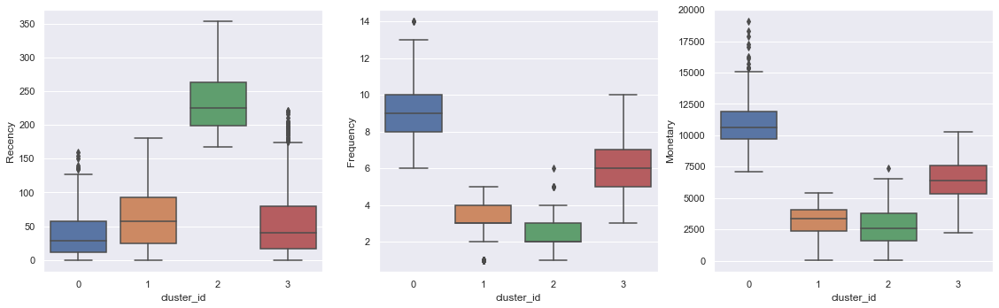

In [206]:
plt.figure(figsize=(26, 12))
plt.subplot(2,4,1)
sns.boxplot(x='cluster_id', y='Recency', data=rfm)
plt.subplot(2,4,2)
sns.boxplot(x='cluster_id', y='Frequency', data=rfm)
plt.subplot(2,4,3)
sns.boxplot(x='cluster_id', y='Monetary', data=rfm)
plt.show()

In [208]:
rfm_1=rfm[rfm['cluster_id']==0]
rfm_1.sort_values(['Recency','Frequency','Monetary'], 
                      ascending=[True,True,True]).head(10)

,customer_id,Monetary,Frequency,Recency,cluster_id,customer_value
2794,2865,11030.02,7,0,0,Platinum
144,151,11422.85,7,0,0,Platinum
187,195,12479.46,7,0,0,Platinum
1368,1407,9199.51,9,0,0,Platinum
2371,2434,10024.41,9,0,0,Platinum
969,1000,10183.70,9,0,0,Platinum
2002,2055,12172.04,9,0,0,Platinum
3344,3433,10471.84,10,0,0,Platinum
1466,1506,11058.14,10,0,0,Platinum
2592,2659,11948.48,12,0,0,Platinum


In [209]:
rfm_2=rfm[rfm['cluster_id']==1]
rfm_2.sort_values(['Recency','Frequency','Monetary'], 
                      ascending=[True,True,True]).head(10)

,customer_id,Monetary,Frequency,Recency,cluster_id,customer_value
2643,2713,1722.85,2,0,1,Lead
2806,2878,2319.39,3,0,1,Lead
1806,1854,3384.56,3,0,1,Lead
656,675,4204.51,3,0,1,Lead
3138,3216,3366.82,4,0,1,Lead
3046,3123,3733.72,4,0,1,Lead
2335,2396,4326.13,4,0,1,Lead
1386,1425,4470.96,4,0,1,Lead
100,106,2906.16,3,1,1,Lead
2179,2236,4226.47,3,1,1,Lead


Inference - As per our analysis more attention needs to be payed to the Premium Customer Value to bring in improvement.  Lead customer Value seems to be doing well so we can in the end maintain this trend for this category .
Let us correlate our answers for both Kmeans and Hierarchical clustering to draw conclusion .

In [178]:
New_high_value_Customers.to_excel("C:\\Users\Daniella\\Desktop\KPMG\\Internship\\New_high_value_Customers.xlsx")
Transaction_DataFrame.to_excel("C:\\Users\Daniella\\Desktop\KPMG\\Internship\\Transaction_DataFrame.xlsx")
Transaction_Platinum_DataFrame.to_excel("C:\\Users\Daniella\\Desktop\\KPMG\\Internship\\Transaction_Platinum_DataFrame.xlsx")